## Import

In [1]:
# Tensorflow
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.python.client import device_lib

# for keras
from classification_models.keras import Classifiers

# model
import tensorflow_addons as tfa
from tensorflow.keras import layers, models
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# image processing, callbacks
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau

from sklearn.metrics import classification_report

# file
import zipfile
import os
import shutil

# sub
from tqdm import tqdm
import random

# basic
import pandas as pd
import numpy as np

# Plot
from concurrent.futures import ThreadPoolExecutor
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import seaborn as sns

c:\Users\coden\anaconda3\envs\tf_gpu\lib\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
c:\Users\coden\anaconda3\envs\tf_gpu\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.11.0 and strictly below 2.14.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.10.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If 

## GPU 연결 확인 및 할당 메모리 제한

In [2]:
print(tf.__version__)
print(device_lib.list_local_devices())

2.10.0
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 9842919183241926893
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 9383706624
locality {
  bus_id: 1
  links {
  }
}
incarnation: 3444089577495718456
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 2080 Ti, pci bus id: 0000:b3:00.0, compute capability: 7.5"
xla_global_id: 416903419
]


In [3]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    tf.config.experimental.set_virtual_device_configuration(
        gpus[0],
        [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=1024 * 11)])
    logical_gpus = tf.config.experimental.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    print(e)

1 Physical GPUs, 1 Logical GPUs


## MISSION 2.[심화] 한국 이미지(음식) 데이터셋을 분류하시오

## 2-1 Mission 1의 결과를 분석한다.

#### 학습용 이미지에 대한 분석 진행

In [4]:
# 체크포인트 파일 경로
checkpoint_filepath = './Checkpoint/Mission1.h5'

# 미션 1 모델 로드
loaded_model = load_model(checkpoint_filepath)

# 데이터 제너레이터 설정
train_data_dir = './Kfood/kfood_train/train/' 

train_datagen = ImageDataGenerator(
    rescale=1.0 / 255
    ) 

# 이미지 크기 설정
img_width, img_height = 224, 224

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=1,
    class_mode='categorical',
    shuffle=False
)

Found 33593 images belonging to 42 classes.


In [ ]:
with tf.device('/device:GPU:0'): 
    train_predict = loaded_model.predict(train_generator)

train_pred_classes = np.argmax(train_predict,axis=1)

# classification report 출력
target_names = list(train_generator.class_indices.keys())

results = pd.DataFrame(classification_report(train_generator.classes, train_pred_classes, target_names=target_names, output_dict=True)).transpose()
print(results)

 7641/33593 [=====>........................] - ETA: 1:54

c:\Users\user\anaconda3\envs\DCC\lib\site-packages\PIL\Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


33593/33593 [==============================] - 149s 4ms/step
              precision    recall  f1-score       support
갈비구이           0.812883  0.981481  0.889262    810.000000
갈치구이           0.998172  0.674907  0.805310    809.000000
감자전            0.793717  0.943960  0.862344    803.000000
경단             0.965035  0.859278  0.909091    803.000000
계란국            0.903030  0.939470  0.920890    793.000000
계란말이           0.948370  0.876884  0.911227    796.000000
계란후라이          0.737041  0.973848  0.839056    803.000000
고등어구이          0.965517  0.896552  0.929757    812.000000
곱창구이           0.987517  0.902408  0.943046    789.000000
김밥             0.993056  0.906210  0.947647    789.000000
김치볶음밥          0.549965  0.987453  0.706463    797.000000
김치전            0.992089  0.792668  0.881237    791.000000
꿀떡             0.991848  0.901235  0.944373    810.000000
누룽지            0.842873  0.934080  0.886136    804.000000
닭갈비            0.715939  0.997519  0.833593    806.000000
더덕구이       

#### 검증용 이미지에 대한 분석 진행

In [ ]:
# 체크포인트 파일 경로
checkpoint_filepath = './Checkpoint/Mission1.h5'

# 모델 로드
loaded_model = load_model(checkpoint_filepath)

# 예측을 위한 데이터 제너레이터 설정
val_data_dir = './Kfood/kfood_val/val/' 

validation_datagen = ImageDataGenerator(
    rescale=1.0 / 255
    ) 

# 이미지 크기 설정
img_width, img_height = 224, 224

validation_generator = validation_datagen.flow_from_directory(
    val_data_dir,
    target_size=(img_height, img_width),
    batch_size=1,
    class_mode='categorical',
    shuffle=False
)

Found 4198 images belonging to 42 classes.


In [ ]:
with tf.device('/device:GPU:0'): 
    validation_predict = loaded_model.predict(validation_generator)

validation_pred_classes = np.argmax(validation_predict,axis=1)

# classification report 출력
target_names = list(validation_generator.class_indices.keys())

validation_results = pd.DataFrame(classification_report(validation_generator.classes, validation_pred_classes, target_names=target_names, output_dict=True)).transpose()
print(validation_results)

4198/4198 [==============================] - 20s 5ms/step
              precision    recall  f1-score      support
갈비구이           0.150000  0.423529  0.221538    85.000000
갈치구이           0.555556  0.050505  0.092593    99.000000
감자전            0.195266  0.333333  0.246269    99.000000
경단             0.296296  0.170213  0.216216    94.000000
계란국            0.495413  0.556701  0.524272    97.000000
계란말이           0.425926  0.209091  0.280488   110.000000
계란후라이          0.225941  0.545455  0.319527    99.000000
고등어구이          0.283019  0.161290  0.205479    93.000000
곱창구이           0.538462  0.203883  0.295775   103.000000
김밥             0.690476  0.261261  0.379085   111.000000
김치볶음밥          0.132867  0.581633  0.216319    98.000000
김치전            0.666667  0.173913  0.275862   115.000000
꿀떡             0.836735  0.394231  0.535948   104.000000
누룽지            0.325000  0.397959  0.357798    98.000000
닭갈비            0.180556  0.611765  0.278820    85.000000
더덕구이           0.440678  0.273

#### Train과 Validation set의 클래스 별 예측결과 성능 확인

In [ ]:
def plot_f1_score_by_class(ax, results, title, label, line_value=None):
    ax.bar(results.index, results['f1-score'], color=colors)
    ax.set_xlabel('Class')
    ax.set_ylabel('f1-score')
    ax.set_title(title)
    ax.set_xticklabels(results.index, rotation=90)
    ax.set_ylim(0, 1)
    
    if line_value is not None:
        ax.axhline(y=line_value, color='red', linestyle='--', label=label)

C:\Users\user\AppData\Local\Temp\ipykernel_14332\1433650739.py:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(results.index, rotation=90)


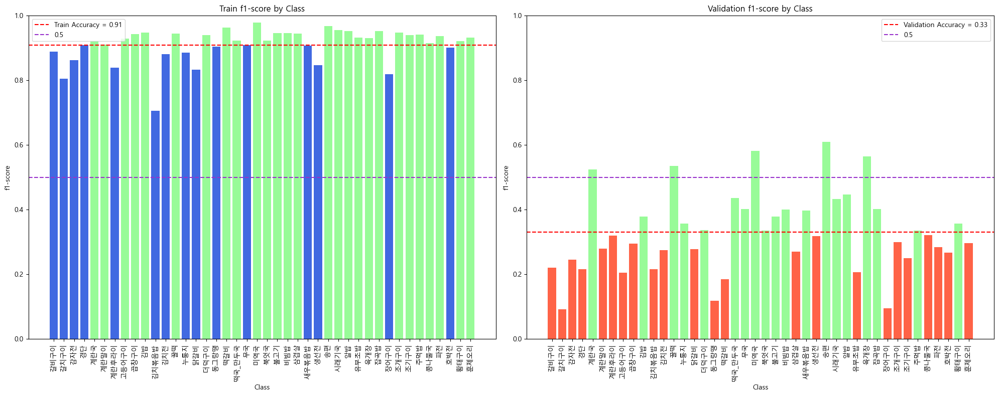

In [ ]:
plt.figure(figsize=(20, 8))

# Train 
ax1 = plt.subplot(1, 2, 1)
colors = ['palegreen' if score >= train_acc else 'royalblue' if score >= 0.5 else 'tomato' for score in train_results['f1-score']]
plot_f1_score_by_class(ax1, train_results, 'Train f1-score by Class', f'Train Accuracy = {train_acc:.2f}', train_acc)
ax1.axhline(y=0.5, color='darkorchid', linestyle='--', label='0.5')
ax1.legend()

# Valid
ax2 = plt.subplot(1, 2, 2)
colors = ['palegreen' if score >= valid_acc else 'royalblue' if score >= 0.5 else 'tomato' for score in valid_results['f1-score']]
plot_f1_score_by_class(ax2, valid_results, 'Validation f1-score by Class', f'Validation Accuracy = {valid_acc:.2f}', valid_acc)
ax2.axhline(y=0.5, color='darkorchid', linestyle='--', label='0.5')
ax2.legend()

plt.tight_layout()
plt.show()

#### 데이터 분포도

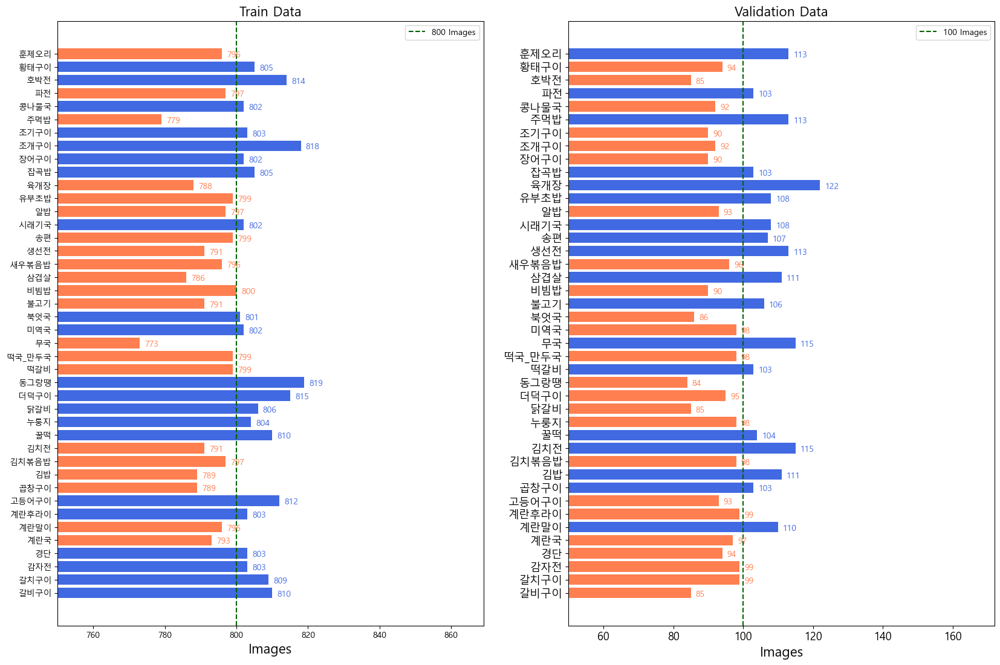

In [ ]:
# 첫 번째 그래프
plt.rcParams['font.family'] = 'Malgun Gothic'
main1 = './kfood/kfood_train/train'

data1 = dict()

for i in os.listdir(main1):
    sub_dir = os.path.join(main1, i)
    count = len(os.listdir(sub_dir))
    data1[i] = count

keys1 = data1.keys()
values1 = data1.values()

colors1 = ["coral" if x <= 800 else "royalblue" for x in values1]

# 두 번째 그래프
main2 = './kfood/kfood_val/val'

data2 = dict()

for i in os.listdir(main2):
    sub_dir = os.path.join(main2, i)
    count = len(os.listdir(sub_dir))
    data2[i] = count

keys2 = data2.keys()
values2 = data2.values()

colors2 = ["coral" if x <= 100 else "royalblue" for x in values2]

# 두 개의 그래프를 나란히 그리기
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 13))

# 첫 번째 그래프
y_pos1 = np.arange(len(values1))
ax1.barh(y_pos1, values1, align='center', color=colors1)
for i, v in enumerate(values1):
    ax1.text(v + 1.4, i - 0.25, str(v), color=colors1[i])
ax1.set_yticks(y_pos1)
ax1.set_yticklabels(keys1)
ax1.set_xlabel('Images', fontsize=16)

# y 축 범위 설정
ax1.set_xlim(750, max(values1) + 50)

# 800에 라인 그리기
ax1.axvline(x=800, color='darkgreen', linestyle='--', label='800 Images')

ax1.set_title('Train Data', fontsize=16)

# 두 번째 그래프
y_pos2 = np.arange(len(values2))
ax2.barh(y_pos2, values2, align='center', color=colors2)
for i, v in enumerate(values2):
    ax2.text(v + 1.4, i - 0.25, str(v), color=colors2[i])
ax2.set_yticks(y_pos2)
ax2.set_yticklabels(keys2)
ax2.set_xlabel('Images', fontsize=16)

# y 축 범위 설정
ax2.set_xlim(50, max(values2) + 50)

# 100에 라인 그리기
ax2.axvline(x=100, color='darkgreen', linestyle='--', label='100 Images')

ax2.set_title('Validation Data', fontsize=16)

plt.xticks(color='black', fontsize=13)
plt.yticks(fontsize=13)

# 범례 추가
ax1.legend()
ax2.legend()

plt.show()

### 시각화 맞춘 샘플과 못맞춘 샘플에 대한 분석 진행

#### Mission 1 모델의 검증 결과대로 이미지를 분류하여 저장

In [ ]:
# 예측 결과 폴더
result_dir = './valid_pred_results/'

# 검증 데이터 디렉토리
val_data_dir = './Kfood/kfood_val/val/'

# 예측 결과 폴더 확인 및 생성
if not os.path.exists(result_dir):
    os.makedirs(result_dir)

# 클래스 이름 추출
target_names = list(validation_generator.class_indices.keys())

# 예측 결과를 기반으로 이미지 분류 및 복사
for i in tqdm(range(len(validation_generator.filenames))):
    filename = validation_generator.filenames[i]
    true_class = validation_generator.classes[i]
    pred_class = validation_pred_classes[i]
    
    class_name = target_names[true_class]
    image_path = os.path.join(val_data_dir, filename)
    
    if true_class == pred_class:
        # 정답을 맞춘 경우
        save_dir = os.path.join(result_dir, class_name, 'correct')
    else:
        # 정답을 못 맞춘 경우
        save_dir = os.path.join(result_dir, class_name, 'incorrect')
    
    # 해당 클래스 폴더가 없으면 생성
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    
    # 이미지를 해당 폴더로 복사
    shutil.copy(image_path, save_dir)

print("이미지 분류 및 복사 완료.")

100%|██████████| 4198/4198 [00:03<00:00, 1350.26it/s]

이미지 분류 및 복사 완료.


#### 유사도가 높은 이미지 여부 확인

In [ ]:
# -*- coding:utf-8 -*-
import cv2
import os
import shutil
import numpy as np

directory = './Kfood/kfood_train/train/'  # 카테고리 디렉토리로 변경
output_directory = './duplicate/'  # 중복 이미지를 저장할 디렉토리
categories = os.listdir(directory)

if not os.path.exists(output_directory):
    os.makedirs(output_directory)
# 이미지 특징 비교를 위한 비교자 초기화
sift = cv2.SIFT_create()

# 각 카테고리 내에서 중복 이미지 찾기
for category in tqdm(categories):
    category_path = os.path.join(directory, category)
    if os.path.isdir(category_path):
        image_features = {}  # 이미지 특징 저장

        for filename in os.listdir(category_path):
            if filename.endswith(('.jpg', '.jpeg', '.png')):  # 이미지 파일 확장자에 따라 수정
                image_path = os.path.join(category_path, filename).replace("\\", "/")
                img_array = np.fromfile(image_path, np.uint8)
                img = cv2.imdecode(img_array, cv2.IMREAD_GRAYSCALE)
                if img is not None:
                    kp, des = sift.detectAndCompute(img, None)  # 이미지의 특징 추출

                    if des is not None:
                        des = tuple(des.tobytes())
                        # 중복된 특징이 이미 저장되어 있는지 확인
                        if des in image_features:
                            # 중복 이미지를 duplicate 폴더에 복사
                            duplicate_path = os.path.join(output_directory, category)
                            if not os.path.exists(duplicate_path):
                                os.makedirs(duplicate_path)
                            shutil.copy(image_path, os.path.join(duplicate_path, filename))
                            
                        else:
                            image_features[des] = filename

100%|██████████| 42/42 [30:20<00:00, 43.34s/it]


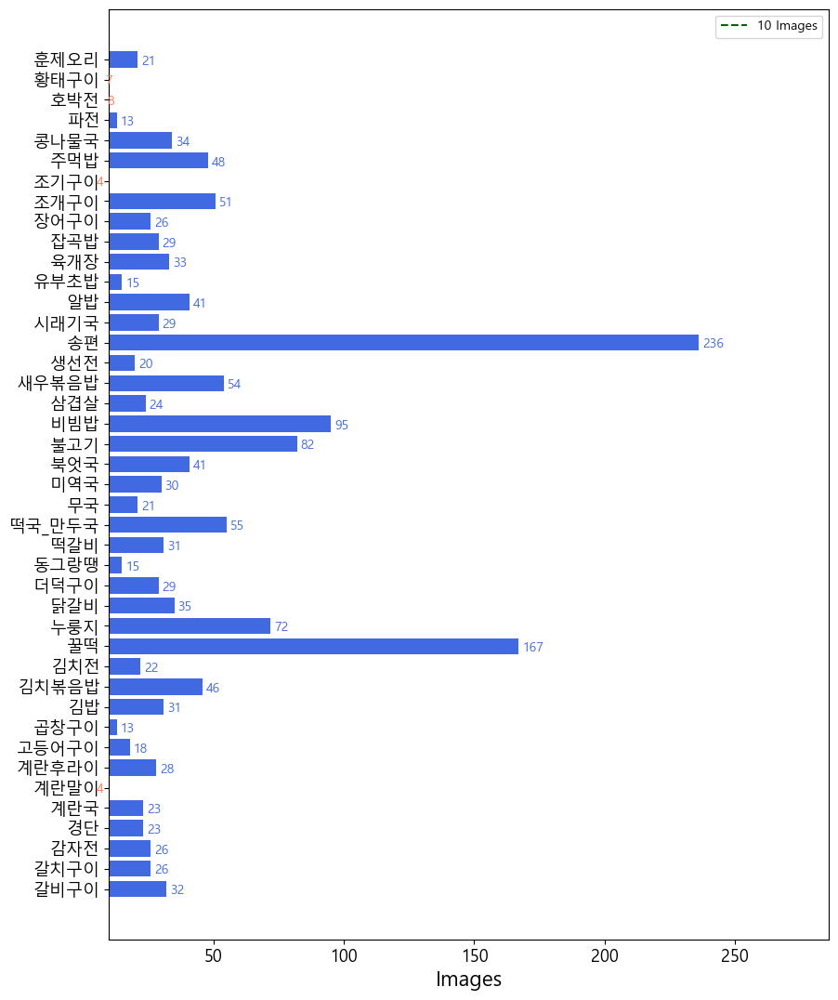

In [ ]:
plt.rcParams['font.family'] = 'Malgun Gothic'
main = './duplicate/'

data = dict()

for i in os.listdir(main):
    sub_dir = os.path.join(main, i)
    count = len(os.listdir(sub_dir))
    data[i] = count


keys = data.keys()
values = data.values()

colors = ["coral" if x <= 10 else "royalblue" for x in values]

fig, ax = plt.subplots(figsize=(10, 13))
y_pos = np.arange(len(values))
plt.barh(y_pos, values, align='center', color=colors)
for i, v in enumerate(values):
    ax.text(v + 1.4, i - 0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images', fontsize=16)

# y 축 범위 설정
ax.set_xlim(10, max(values) + 50)

# 800에 라인 그리기
ax.axvline(x=10, color='darkgreen', linestyle='--', label='10 Images')

plt.xticks(color='black', fontsize=13)
plt.yticks(fontsize=13)

# 범례 추가
plt.legend()

plt.show()


#### 맞춘 샘플과 못맞춘 샘플의 RGB & HSV Value 확인

In [ ]:
data = []

base_dir = "./valid_pred_results/"

def process_image(image_path, food_folder, category):
    image = Image.open(image_path)

    # RGB 값 추출
    rgb_values = np.array(image)

    # RGB 값의 평균 계산
    r_mean, g_mean, b_mean = np.mean(rgb_values, axis=(0, 1))

    # 데이터를 리스트에 추가
    data.append([food_folder, image_path, category, r_mean, g_mean, b_mean])

with ThreadPoolExecutor() as executor:
    for food_folder in tqdm(os.listdir(base_dir)):
        food_path = os.path.join(base_dir, food_folder)
        if os.path.isdir(food_path):
            for category in ["correct", "incorrect"]:
                category_path = os.path.join(food_path, category)
                if os.path.isdir(category_path):
                    image_files = [f for f in os.listdir(category_path) if f.endswith(".jpg")]
                    image_paths = [os.path.join(category_path, image_file) for image_file in image_files]
                    for image_path in image_paths:
                        executor.submit(process_image, image_path, food_folder, category)

# 데이터프레임 생성
df = pd.DataFrame(data, columns=["food", "image_path", "Correct/Incorrect", "R", "G", "B"])
df.to_csv("rgb_values.csv", index=False)

  0%|          | 0/42 [00:00<?, ?it/s]

100%|██████████| 42/42 [00:01<00:00, 21.51it/s]


In [ ]:
data = []

base_dir = "./valid_pred_results/"

def process_image(image_path, food_folder, category):
    image = Image.open(image_path)

    # HSV 값 추출
    hsv_values = np.array(image.convert('HSV'))

    # HSV 값의 평균 계산
    h_mean, s_mean, v_mean = np.mean(hsv_values, axis=(0, 1))

    # 데이터를 리스트에 추가
    data.append([food_folder, image_path, category, h_mean, s_mean, v_mean])

with ThreadPoolExecutor() as executor:
    for food_folder in tqdm(os.listdir(base_dir)):
        food_path = os.path.join(base_dir, food_folder)
        if os.path.isdir(food_path):
            for category in ["correct", "incorrect"]:
                category_path = os.path.join(food_path, category)
                if os.path.isdir(category_path):
                    image_files = [f for f in os.listdir(category_path) if f.endswith(".jpg")]
                    image_paths = [os.path.join(category_path, image_file) for image_file in image_files]
                    for image_path in image_paths:
                        executor.submit(process_image, image_path, food_folder, category)

# 데이터프레임 생성
df = pd.DataFrame(data, columns=["food", "image_path", "Correct/Incorrect", "H", "S", "V"])
df.to_csv("hsv_values.csv", index=False)

100%|██████████| 42/42 [00:01<00:00, 31.29it/s]


#### RGB Values Distribution

In [ ]:
rgb_values = pd.read_csv("./rgb_values.csv")

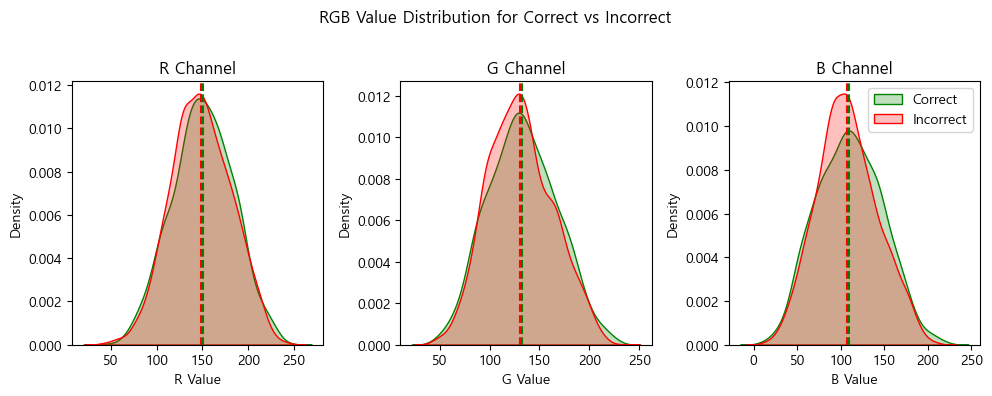

In [ ]:
# 'Correct/Incorrect' 컬럼을 기준으로 데이터를 나눕니다.
correct_data = rgb_values[rgb_values['Correct/Incorrect'] == 'correct']
incorrect_data = rgb_values[rgb_values['Correct/Incorrect'] == 'incorrect']

plt.figure(figsize=(10, 4))
plt.suptitle('RGB Value Distribution for Correct vs Incorrect')

for i, channel in enumerate(['R', 'G', 'B']):
    plt.subplot(1, 3, i+1)
    plt.title(f'{channel} Channel')

    # RGB 값에 대한 커널 밀도 플롯을 그립니다.
    sns.kdeplot(correct_data[channel], label=f'Correct {channel}', color = 'green', fill=True)
    sns.kdeplot(incorrect_data[channel], label=f'Incorrect {channel}', color = 'red', fill=True)

    # 평균값에 점선 추가
    plt.axvline(correct_data[channel].mean(), color='green', linestyle='--', label='Mean (Correct)')
    plt.axvline(incorrect_data[channel].mean(), color='red', linestyle='--', label='Mean (Incorrect)')

    plt.xlabel(f'{channel} Value')
    plt.ylabel('Density')
    
plt.legend(['Correct', 'Incorrect'])
plt.tight_layout()
plt.subplots_adjust(top=0.8)
plt.show()

In [ ]:
import numpy as np

# 각 채널 및 그룹에 대한 표준 편차 계산
std_dev_correct_R = np.std(correct_data['R'])
std_dev_correct_G = np.std(correct_data['G'])
std_dev_correct_B = np.std(correct_data['B'])

std_dev_incorrect_R = np.std(incorrect_data['R'])
std_dev_incorrect_G = np.std(incorrect_data['G'])
std_dev_incorrect_B = np.std(incorrect_data['B'])

print(f'Standard Deviation (Correct - R): {std_dev_correct_R}')
print(f'Standard Deviation (Correct - G): {std_dev_correct_G}')
print(f'Standard Deviation (Correct - B): {std_dev_correct_B}')

print(f'Standard Deviation (Incorrect - R): {std_dev_incorrect_R}')
print(f'Standard Deviation (Incorrect - G): {std_dev_incorrect_G}')
print(f'Standard Deviation (Incorrect - B): {std_dev_incorrect_B}')

Standard Deviation (Correct - R): 33.33382533729098
Standard Deviation (Correct - G): 34.2035603402196
Standard Deviation (Correct - B): 37.45351484384826
Standard Deviation (Incorrect - R): 32.72970083848543
Standard Deviation (Incorrect - G): 32.40607321771702
Standard Deviation (Incorrect - B): 34.72291369407322


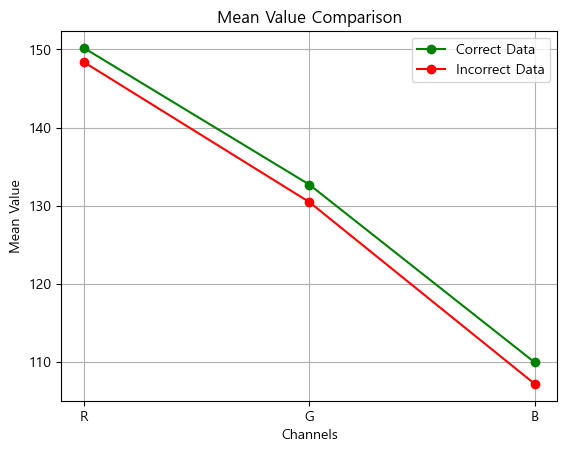

In [ ]:
import matplotlib.pyplot as plt

# 두 데이터프레임의 평균 값을 추출
correct_mean = correct_data.iloc[:, -3:].mean()
incorrect_mean = incorrect_data.iloc[:, -3:].mean()

# 채널 이름
channels = ['R', 'G', 'B']

# 그래프 그리기
plt.plot(channels, correct_mean, marker='o', label='Correct Data', linestyle='-', color='green')
plt.plot(channels, incorrect_mean, marker='o', label='Incorrect Data', linestyle='-', color='red')

# 그래프에 레이블 추가
plt.xlabel('Channels')
plt.ylabel('Mean Value')
plt.title('Mean Value Comparison')

# 범례 추가
plt.legend()

# 그래프 표시
plt.grid()
plt.show()

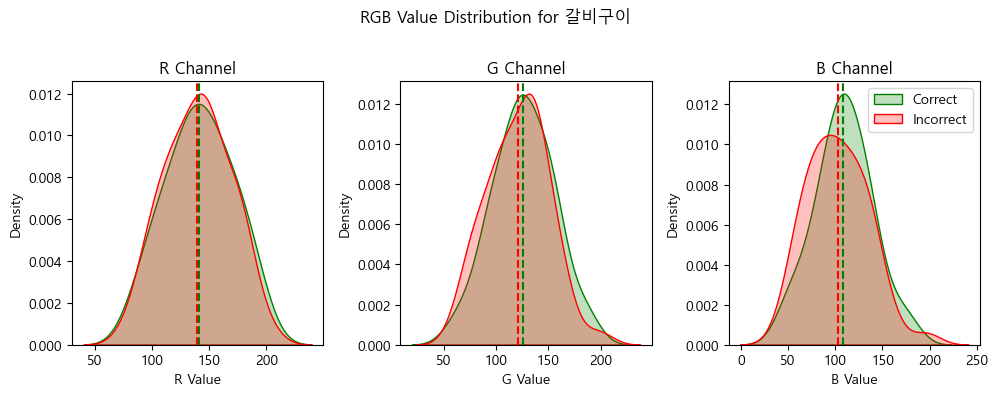

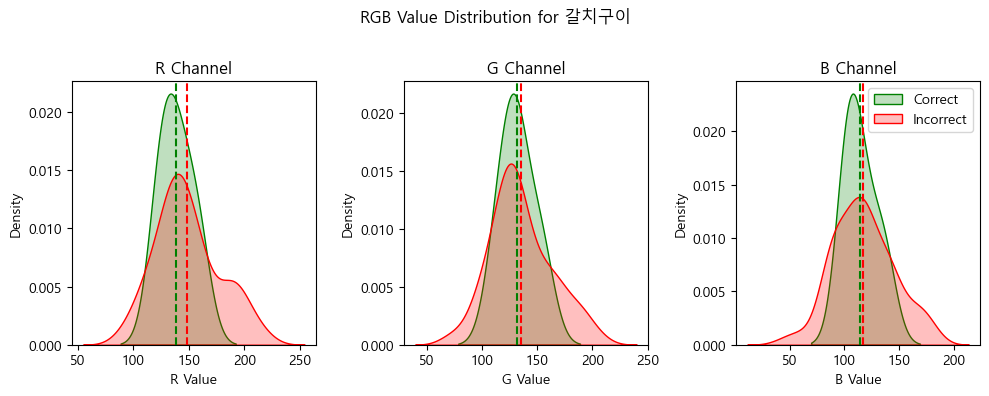

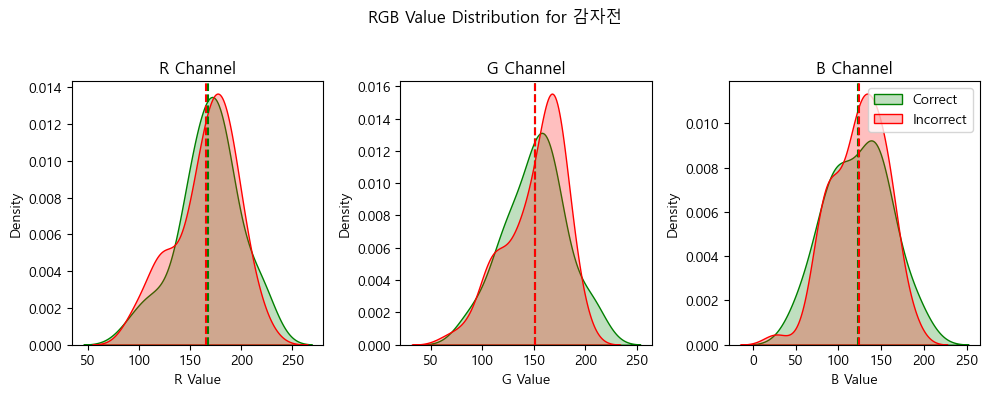

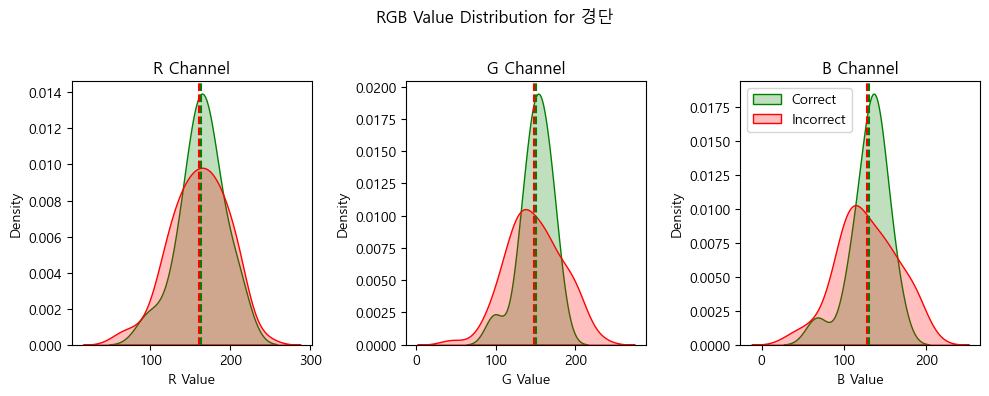

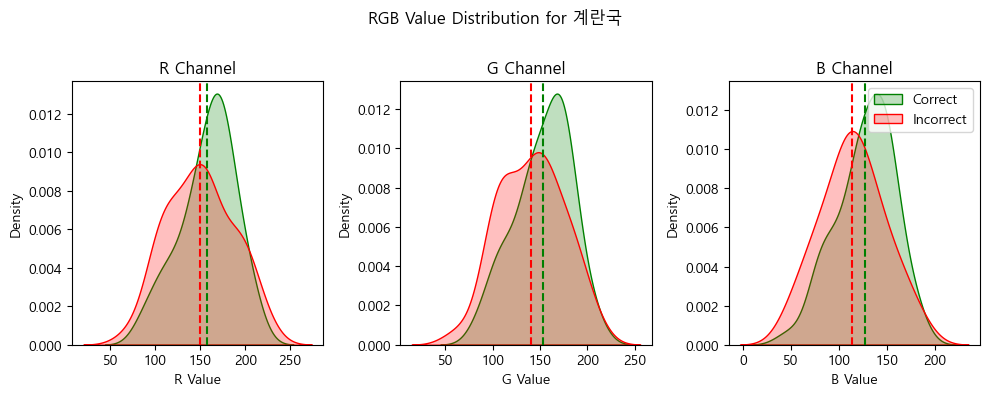

...

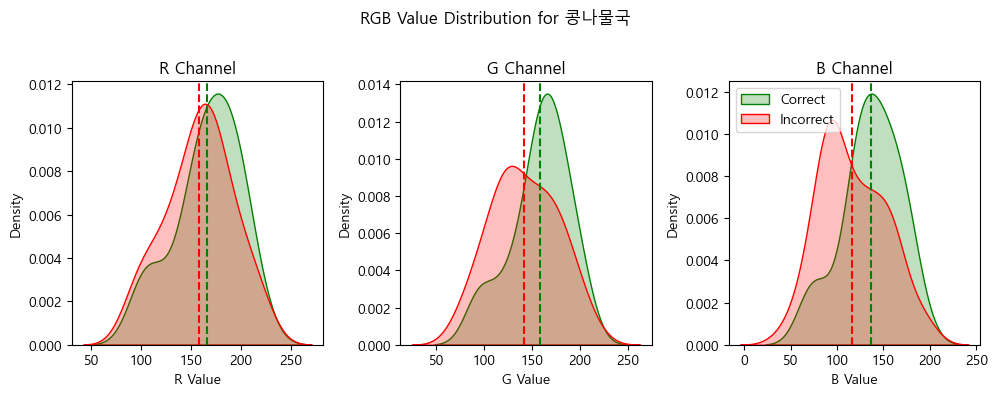

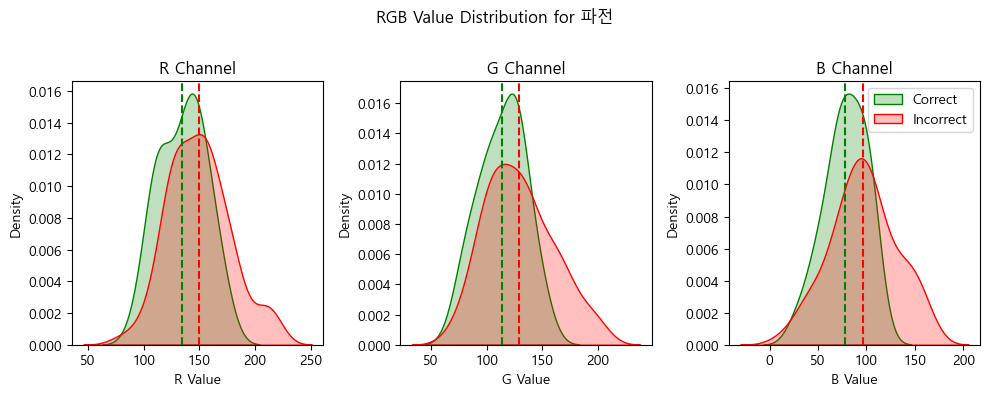

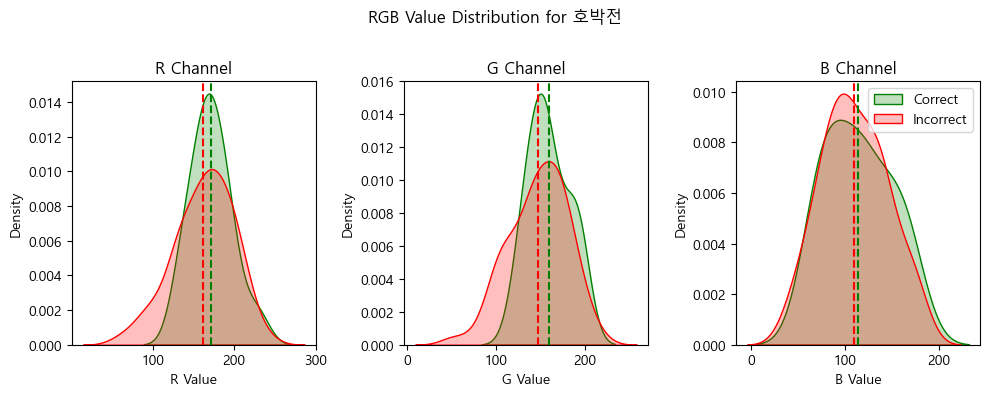

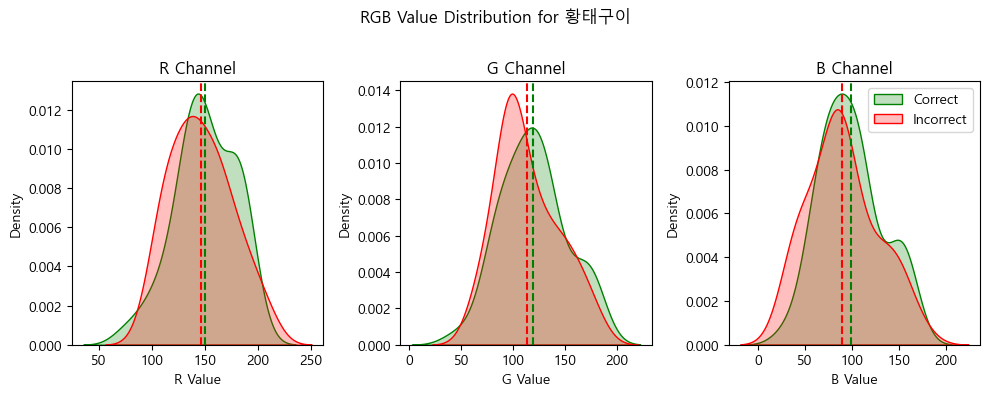

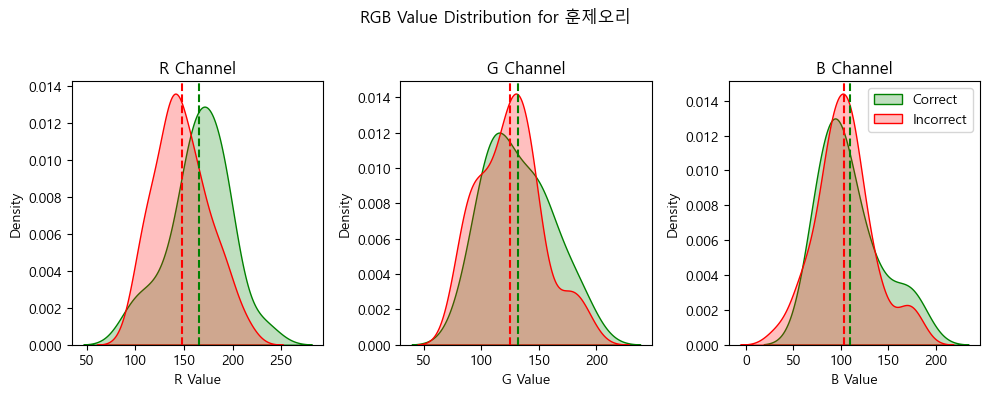

In [ ]:
plt.rcParams['font.family'] = 'Malgun Gothic'

output_folder = 'Mission1_RGB_values'
os.makedirs(output_folder, exist_ok=True)

grouped_data = rgb_values.groupby('food')

# 커널 밀도 플롯을 그립니다.
for food, group in grouped_data:
    plt.figure(figsize=(10, 4))
    plt.suptitle(f'RGB Value Distribution for {food}')

    for i, channel in enumerate(['R', 'G', 'B']):
        plt.subplot(1, 3, i+1)
        plt.title(f'{channel} Channel')

        correct_data = group[group['Correct/Incorrect'] == 'correct']
        incorrect_data = group[group['Correct/Incorrect'] == 'incorrect']

        # RGB 값에 대한 커널 밀도 플롯을 그립니다.
        sns.kdeplot(correct_data[channel], label=f'Correct {channel}', color = 'green', fill=True)
        sns.kdeplot(incorrect_data[channel], label=f'Incorrect {channel}', color = 'red', fill=True)

        # 평균값에 점선 추가
        plt.axvline(correct_data[channel].mean(), color='green', linestyle='--', label='Mean (Correct)')
        plt.axvline(incorrect_data[channel].mean(), color='red', linestyle='--', label='Mean (Incorrect)')

        # plt.legend()
        plt.xlabel(f'{channel} Value')
        plt.ylabel('Density')

    plt.legend(['Correct', 'Incorrect'])
    plt.tight_layout()
    plt.subplots_adjust(top=0.8)
    
    output_file = os.path.join(output_folder, f'{food}_RGB.png')
    plt.savefig(output_file)

    plt.show()

#### HSV Values Distribution

In [ ]:
hsv_values = pd.read_csv("./hsv_values.csv")

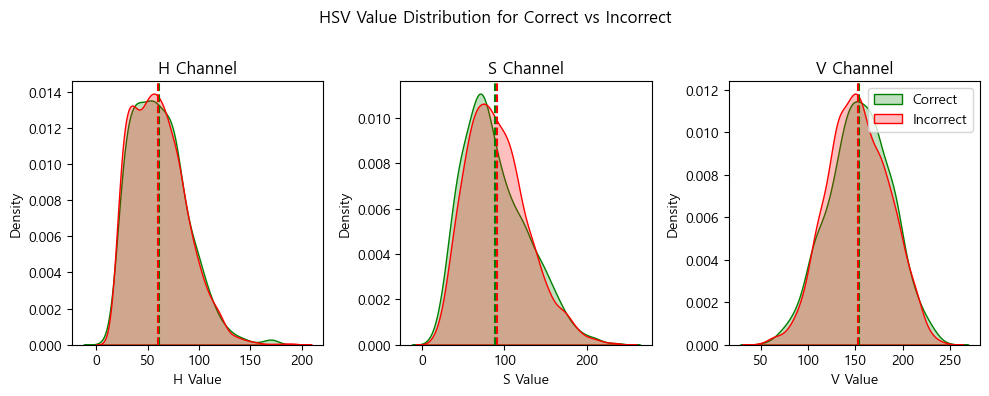

In [ ]:
# 'Correct/Incorrect' 컬럼을 기준으로 데이터를 나눕니다.
correct_data = hsv_values[hsv_values['Correct/Incorrect'] == 'correct']
incorrect_data = hsv_values[hsv_values['Correct/Incorrect'] == 'incorrect']

plt.figure(figsize=(10, 4))
plt.suptitle('HSV Value Distribution for Correct vs Incorrect')

for i, channel in enumerate(['H', 'S', 'V']):
    plt.subplot(1, 3, i+1)
    plt.title(f'{channel} Channel')

    # hsv 값에 대한 커널 밀도 플롯을 그립니다.
    sns.kdeplot(correct_data[channel], label=f'Correct {channel}', color = 'green', fill=True)
    sns.kdeplot(incorrect_data[channel], label=f'Incorrect {channel}', color = 'red', fill=True)

    # 평균값에 점선 추가
    plt.axvline(correct_data[channel].mean(), color='green', linestyle='--', label='Mean (Correct)')
    plt.axvline(incorrect_data[channel].mean(), color='red', linestyle='--', label='Mean (Incorrect)')

    plt.xlabel(f'{channel} Value')
    plt.ylabel('Density')

plt.legend(['Correct', 'Incorrect'])
plt.tight_layout()
plt.subplots_adjust(top=0.8)
plt.show()

In [ ]:
import numpy as np

# 각 채널 및 그룹에 대한 표준 편차 계산
std_dev_correct_H = np.std(correct_data['H'])
std_dev_correct_S = np.std(correct_data['S'])
std_dev_correct_V = np.std(correct_data['V'])

std_dev_incorrect_H = np.std(incorrect_data['H'])
std_dev_incorrect_S = np.std(incorrect_data['S'])
std_dev_incorrect_V = np.std(incorrect_data['V'])

print(f'Standard Deviation (Correct - H): {std_dev_correct_H}')
print(f'Standard Deviation (Correct - S): {std_dev_correct_S}')
print(f'Standard Deviation (Correct - V): {std_dev_correct_V}')

print(f'Standard Deviation (Incorrect - H): {std_dev_incorrect_H}')
print(f'Standard Deviation (Incorrect - S): {std_dev_incorrect_S}')
print(f'Standard Deviation (Incorrect - V): {std_dev_incorrect_V}')

Standard Deviation (Correct - H): 26.960436219245764
Standard Deviation (Correct - S): 39.11571905394153
Standard Deviation (Correct - V): 32.91660164957206
Standard Deviation (Incorrect - H): 26.404687926513713
Standard Deviation (Incorrect - S): 37.066286835964014
Standard Deviation (Incorrect - V): 32.15340887863809


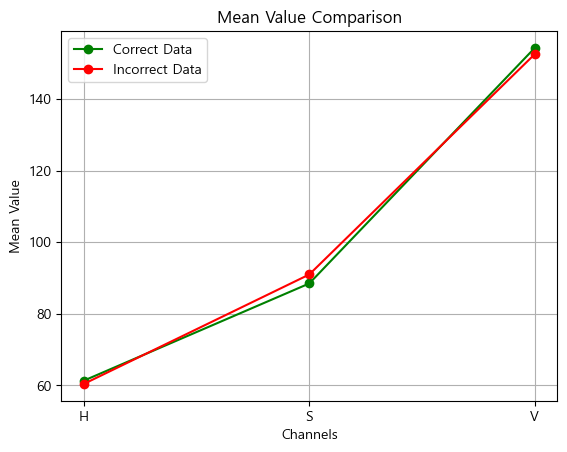

In [ ]:
import matplotlib.pyplot as plt

# 두 데이터프레임의 평균 값을 추출
correct_mean = correct_data.iloc[:, -3:].mean()
incorrect_mean = incorrect_data.iloc[:, -3:].mean()

# 채널 이름
channels = ['H', 'S', 'V']

# 그래프 그리기
plt.plot(channels, correct_mean, marker='o', label='Correct Data', linestyle='-', color='green')
plt.plot(channels, incorrect_mean, marker='o', label='Incorrect Data', linestyle='-', color='red')

# 그래프에 레이블 추가
plt.xlabel('Channels')
plt.ylabel('Mean Value')
plt.title('Mean Value Comparison')

# 범례 추가
plt.legend()

# 그래프 표시
plt.grid()
plt.show()

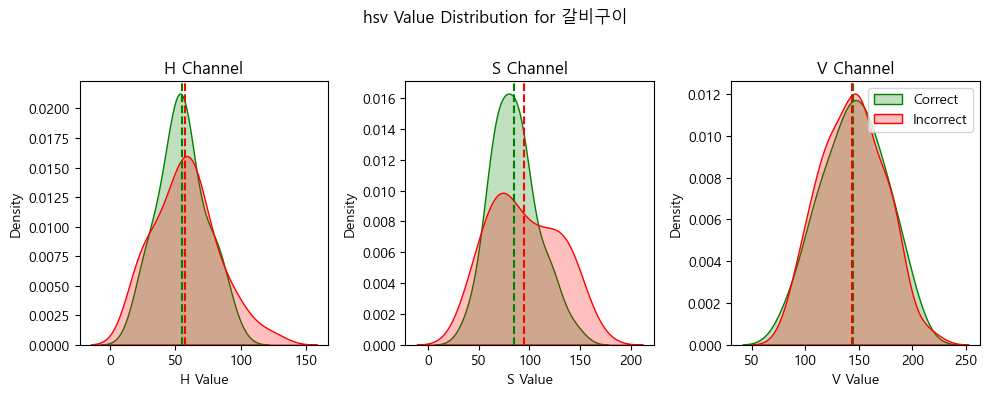

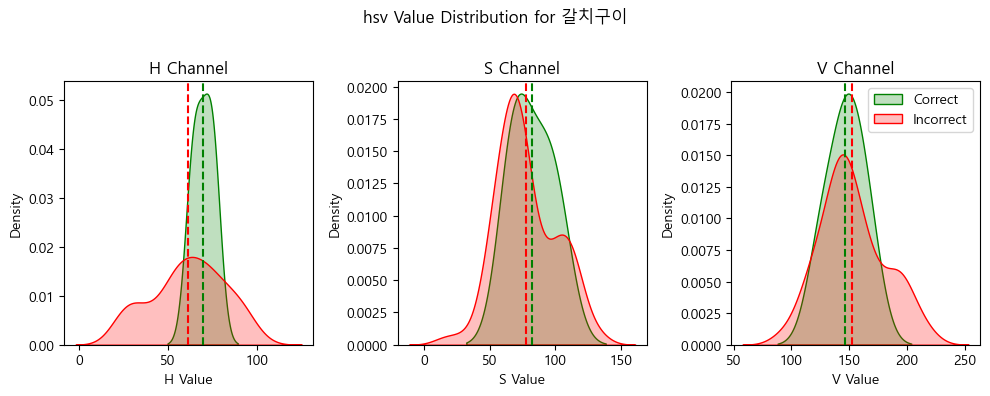

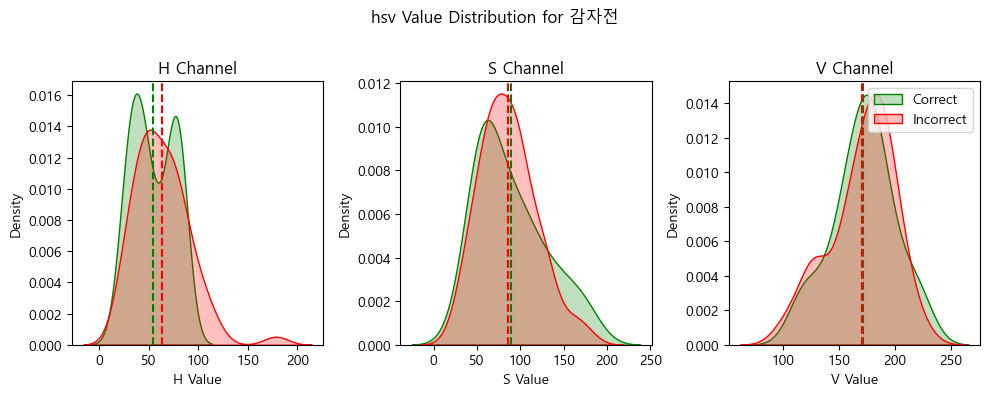

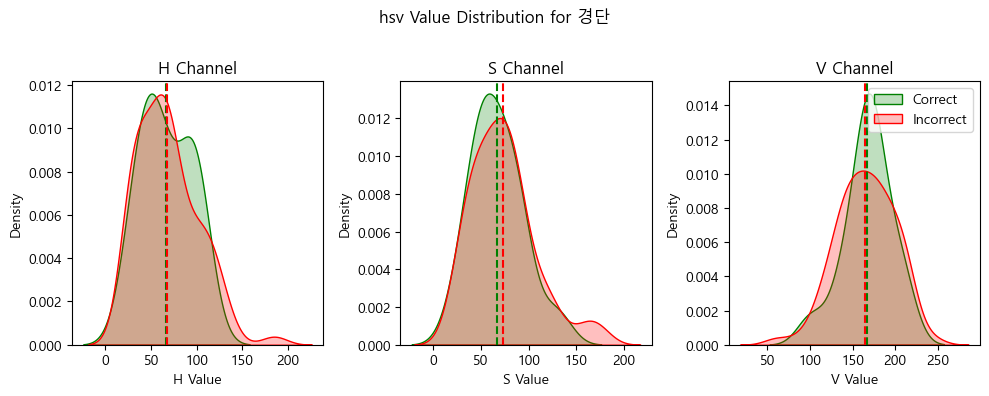

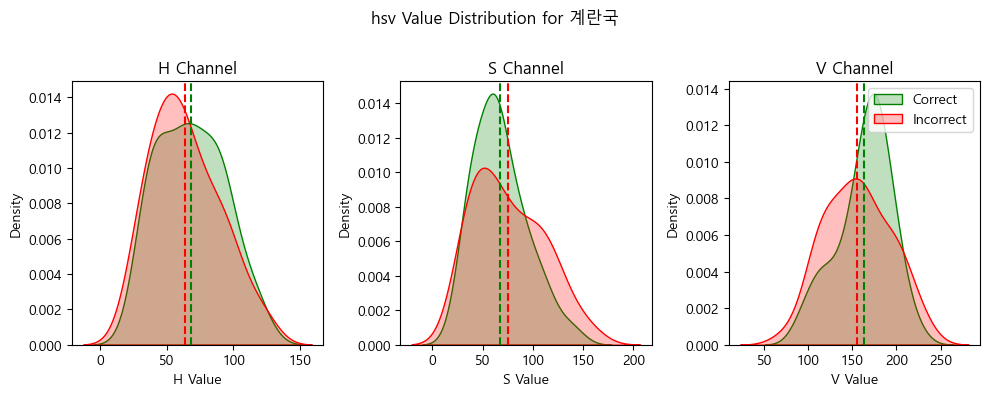

...

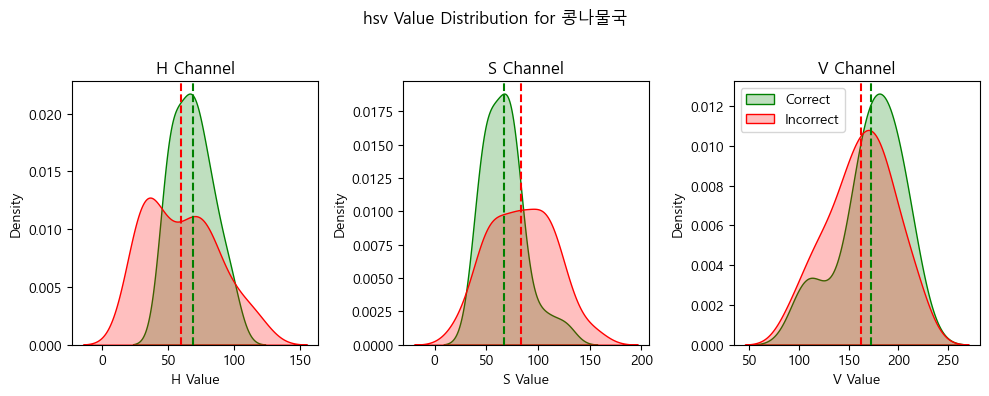

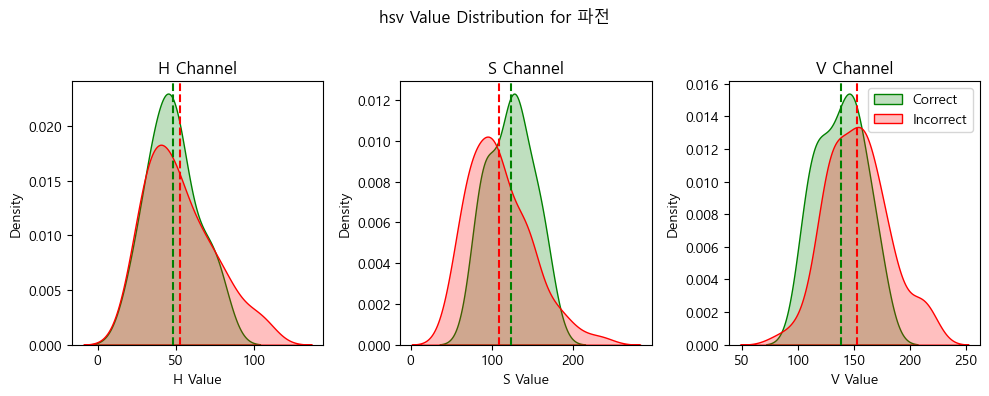

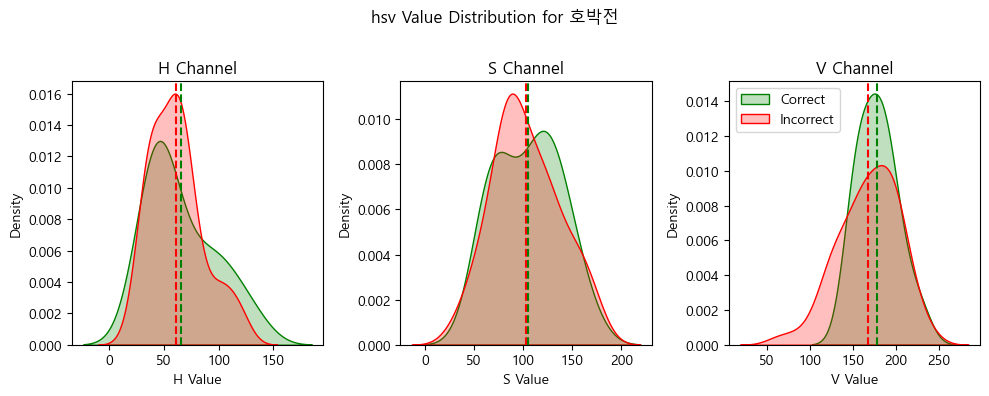

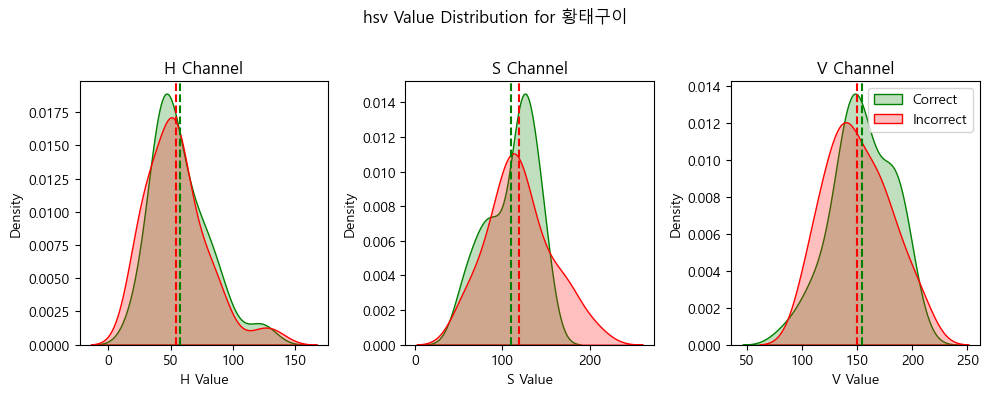

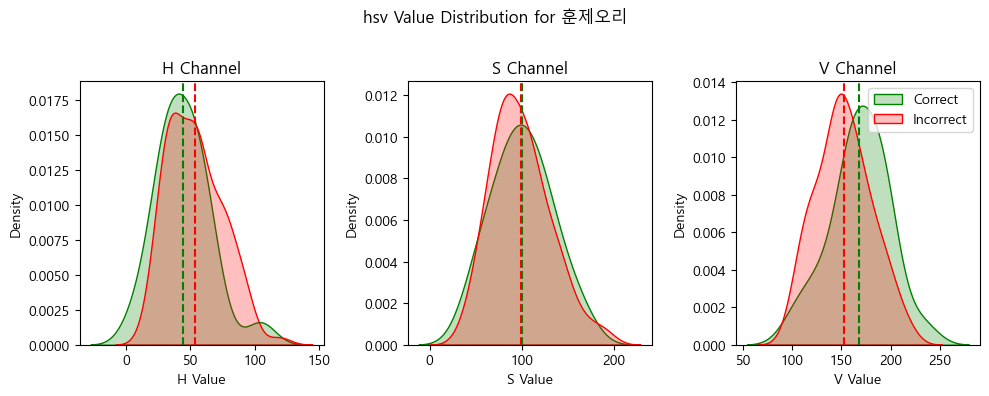

In [ ]:
output_folder = 'Mission1_HSV_values'
os.makedirs(output_folder, exist_ok=True)

grouped_data = hsv_values.groupby('food')

# 커널 밀도 플롯을 그립니다.
for food, group in grouped_data:
    plt.figure(figsize=(10, 4))
    plt.suptitle(f'hsv Value Distribution for {food}')

    for i, channel in enumerate(['H', 'S', 'V']):
        plt.subplot(1, 3, i+1)
        plt.title(f'{channel} Channel')

        correct_data = group[group['Correct/Incorrect'] == 'correct']
        incorrect_data = group[group['Correct/Incorrect'] == 'incorrect']

        # hsv 값에 대한 커널 밀도 플롯을 그립니다.
        sns.kdeplot(correct_data[channel], label=f'Correct {channel}', color = 'green', fill=True)
        sns.kdeplot(incorrect_data[channel], label=f'Incorrect {channel}', color = 'red', fill=True)

        # 평균값에 점선 추가
        plt.axvline(correct_data[channel].mean(), color='green', linestyle='--', label='Mean (Correct)')
        plt.axvline(incorrect_data[channel].mean(), color='red', linestyle='--', label='Mean (Incorrect)')

        # plt.legend()
        plt.xlabel(f'{channel} Value')
        plt.ylabel('Density')

    plt.legend(['Correct', 'Incorrect'])
    plt.tight_layout()
    plt.subplots_adjust(top=0.8)
    
    output_file = os.path.join(output_folder, f'{food}_HSV.png')
    plt.savefig(output_file)
    
    plt.show()

#### value 확인

In [ ]:
import pandas as pd

# 데이터프레임 생성 (데이터프레임 이름은 df라고 가정)
# df = pd.read_csv('your_data.csv')  # 데이터프레임을 CSV 파일에서 읽는 경우

# 'food' 열 값이 '갈비구이'인 행들을 필터링
filtered_df = rgb_values[rgb_values['food'] == '갈비구이']

# R, G, B 열의 평균값 계산
r_mean = filtered_df['R'].mean()
g_mean = filtered_df['G'].mean()
b_mean = filtered_df['B'].mean()

# 결과 출력
print(f"갈비구이의 R 평균값: {r_mean}")
print(f"갈비구이의 G 평균값: {g_mean}")
print(f"갈비구이의 B 평균값: {b_mean}")

갈비구이의 R 평균값: 140.20770975005573
갈비구이의 G 평균값: 122.81792865177277
갈비구이의 B 평균값: 105.02712284574689


In [ ]:
import pandas as pd

# 데이터프레임 생성 (데이터프레임 이름은 df라고 가정)
# df = pd.read_csv('your_data.csv')  # 데이터프레임을 CSV 파일에서 읽는 경우

# 'food' 열 값이 '떡갈비'인 행들을 필터링
filtered_df = rgb_values[rgb_values['food'] == '떡갈비']

# R, G, B 열의 평균값 계산
r_mean = filtered_df['R'].mean()
g_mean = filtered_df['G'].mean()
b_mean = filtered_df['B'].mean()

# 결과 출력
print(f"떡갈비의 R 평균값: {r_mean}")
print(f"떡갈비의 G 평균값: {g_mean}")
print(f"떡갈비의 B 평균값: {b_mean}")

떡갈비의 R 평균값: 141.74048111655011
떡갈비의 G 평균값: 122.44802555328899
떡갈비의 B 평균값: 105.440701331605


In [ ]:
import pandas as pd

# 데이터프레임 생성 (데이터프레임 이름은 df라고 가정)
# df = pd.read_csv('your_data.csv')  # 데이터프레임을 CSV 파일에서 읽는 경우

# 'food' 열 값이 '불고기'인 행들을 필터링
filtered_df = rgb_values[rgb_values['food'] == '불고기']

# R, G, B 열의 평균값 계산
r_mean = filtered_df['R'].mean()
g_mean = filtered_df['G'].mean()
b_mean = filtered_df['B'].mean()

# 결과 출력
print(f"불고기의 R 평균값: {r_mean}")
print(f"불고기의 G 평균값: {g_mean}")
print(f"불고기의 B 평균값: {b_mean}")

불고기의 R 평균값: 139.79351244481552
불고기의 G 평균값: 119.70503850925027
불고기의 B 평균값: 99.19363800252223


#### 3D 시각화

<Figure size 640x480 with 0 Axes>

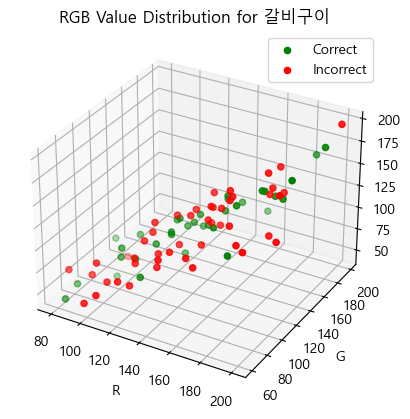

<Figure size 640x480 with 0 Axes>

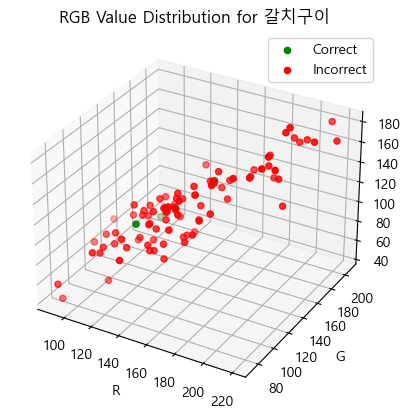

<Figure size 640x480 with 0 Axes>

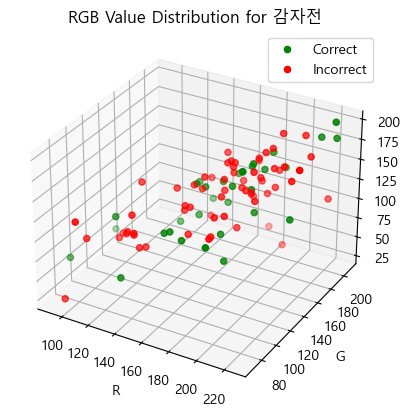

<Figure size 640x480 with 0 Axes>

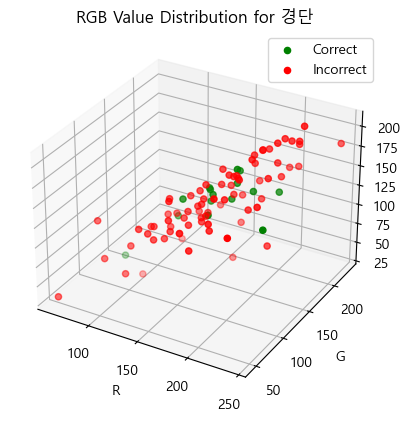

<Figure size 640x480 with 0 Axes>

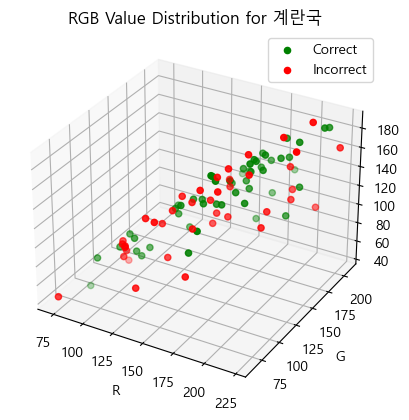

<Figure size 640x480 with 0 Axes>

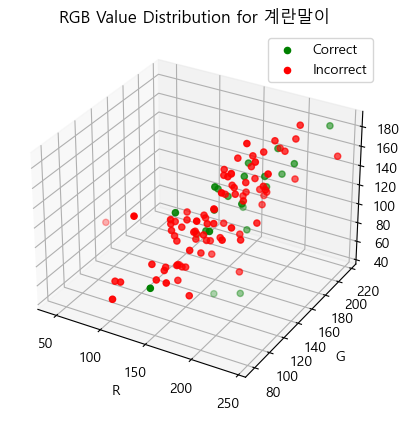

<Figure size 640x480 with 0 Axes>

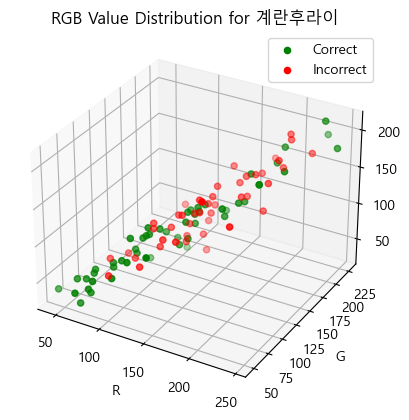

<Figure size 640x480 with 0 Axes>

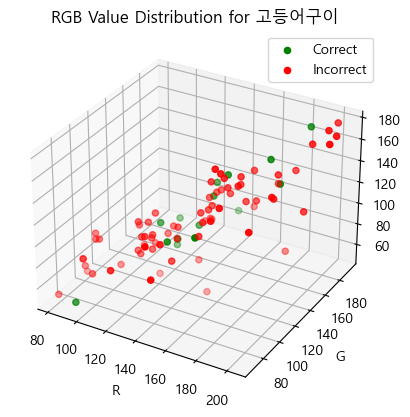

<Figure size 640x480 with 0 Axes>

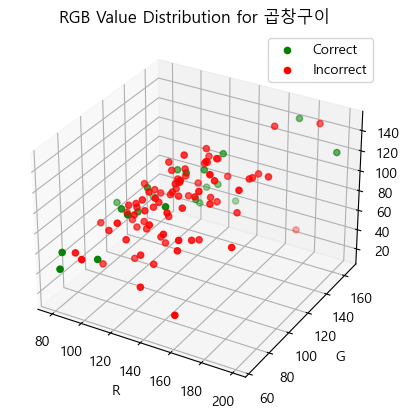

<Figure size 640x480 with 0 Axes>

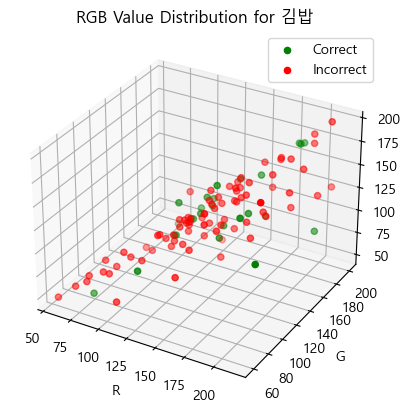

<Figure size 640x480 with 0 Axes>

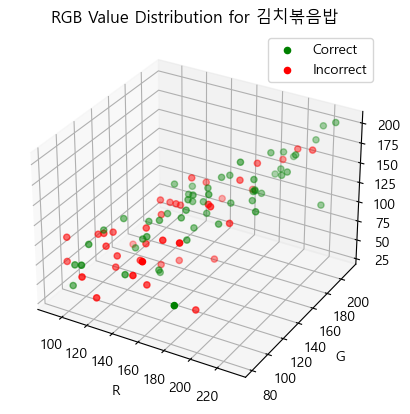

<Figure size 640x480 with 0 Axes>

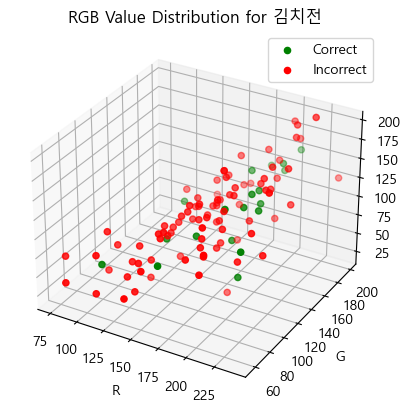

<Figure size 640x480 with 0 Axes>

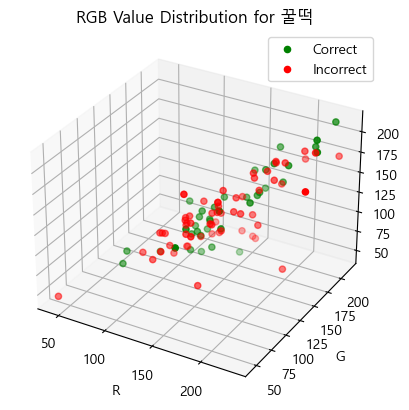

<Figure size 640x480 with 0 Axes>

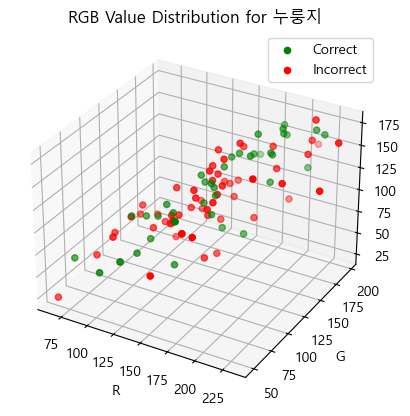

<Figure size 640x480 with 0 Axes>

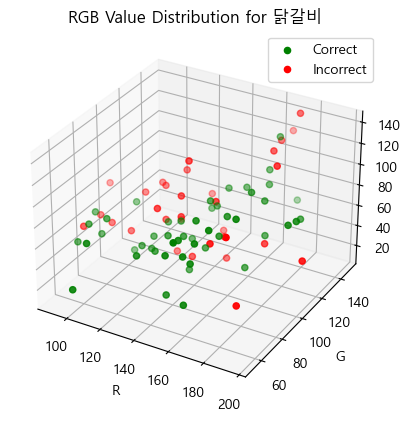

<Figure size 640x480 with 0 Axes>

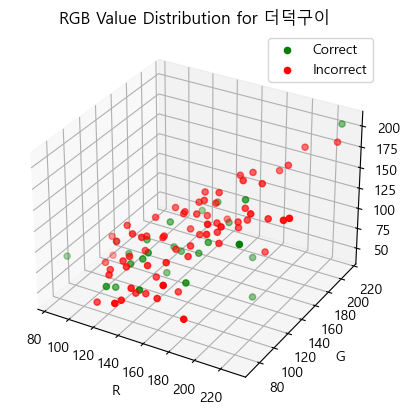

<Figure size 640x480 with 0 Axes>

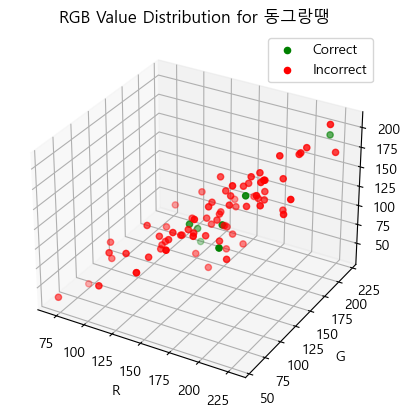

<Figure size 640x480 with 0 Axes>

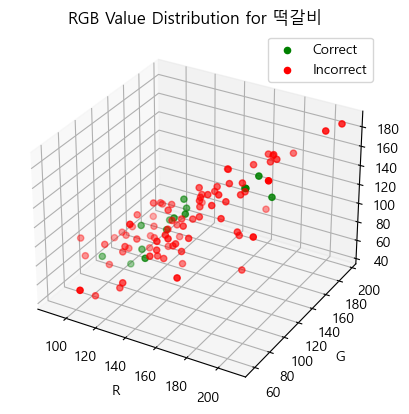

<Figure size 640x480 with 0 Axes>

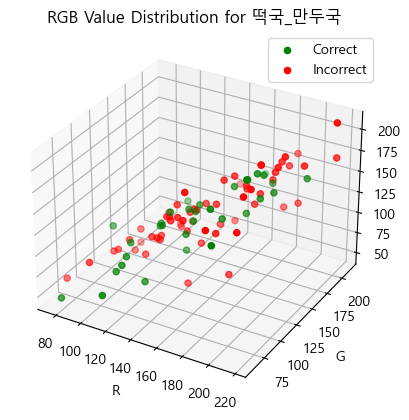

<Figure size 640x480 with 0 Axes>

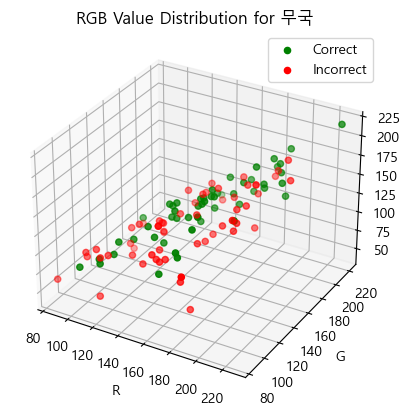

<Figure size 640x480 with 0 Axes>

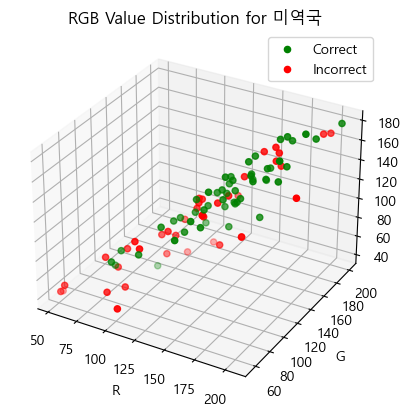

<Figure size 640x480 with 0 Axes>

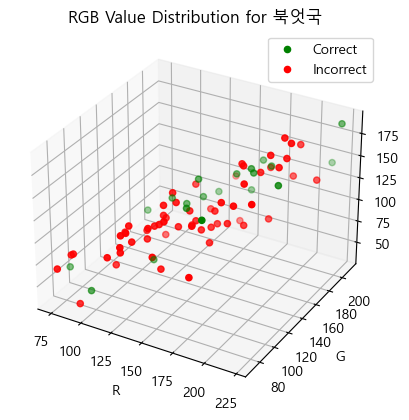

<Figure size 640x480 with 0 Axes>

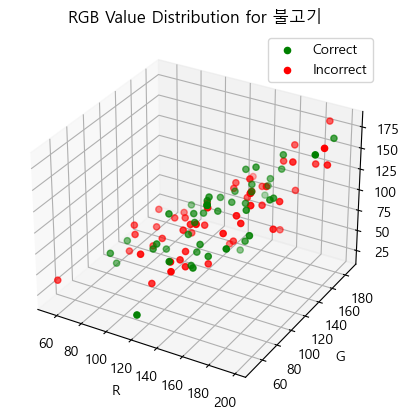

<Figure size 640x480 with 0 Axes>

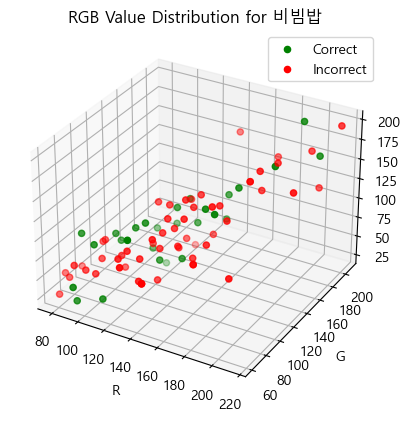

<Figure size 640x480 with 0 Axes>

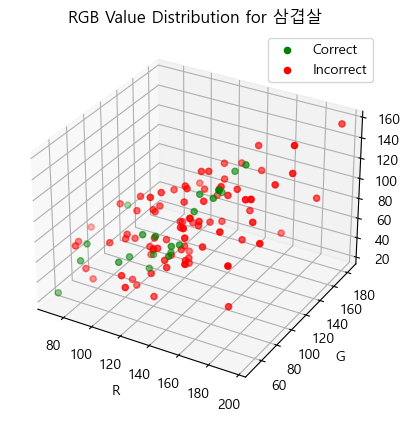

<Figure size 640x480 with 0 Axes>

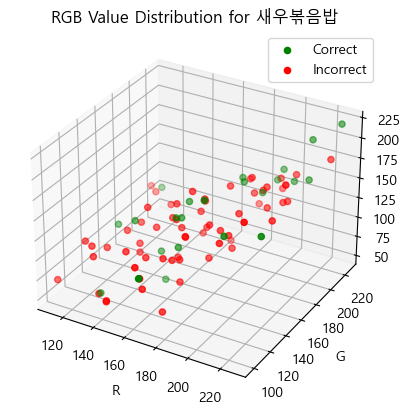

<Figure size 640x480 with 0 Axes>

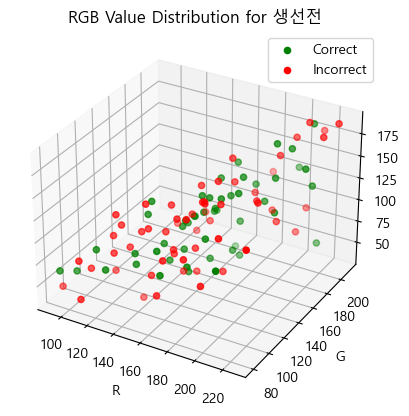

<Figure size 640x480 with 0 Axes>

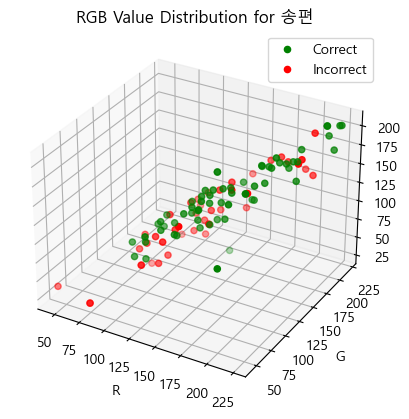

<Figure size 640x480 with 0 Axes>

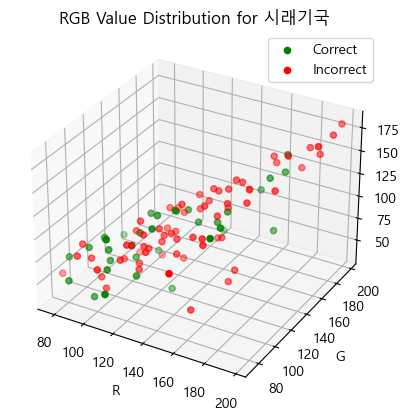

<Figure size 640x480 with 0 Axes>

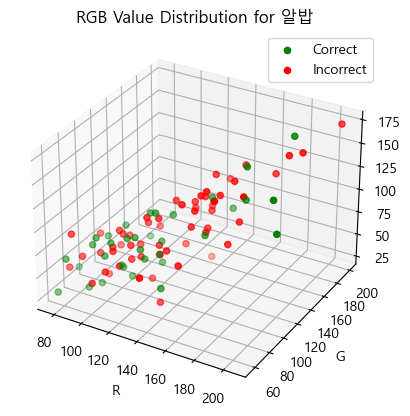

<Figure size 640x480 with 0 Axes>

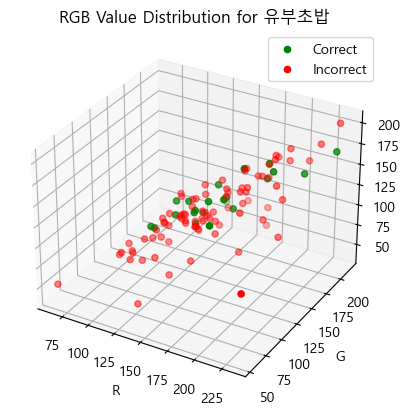

<Figure size 640x480 with 0 Axes>

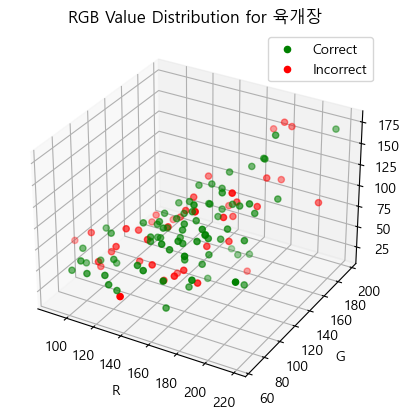

<Figure size 640x480 with 0 Axes>

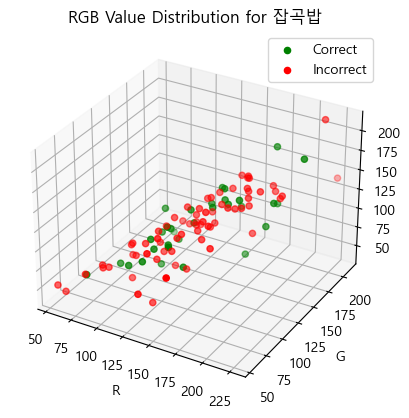

<Figure size 640x480 with 0 Axes>

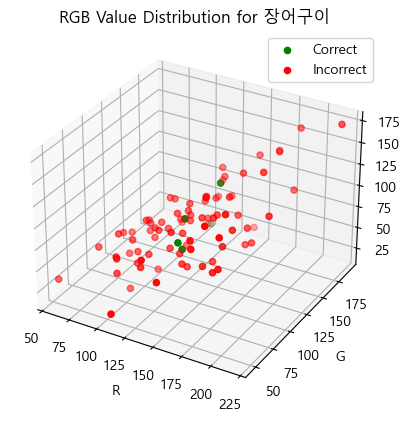

<Figure size 640x480 with 0 Axes>

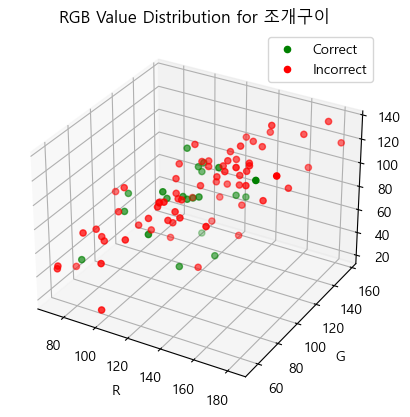

<Figure size 640x480 with 0 Axes>

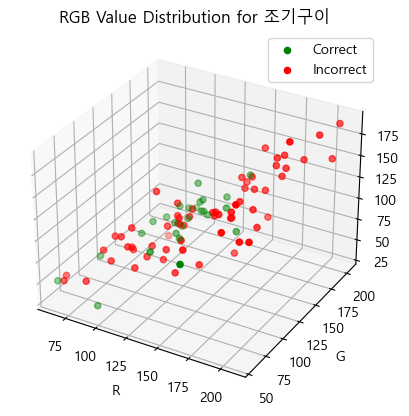

<Figure size 640x480 with 0 Axes>

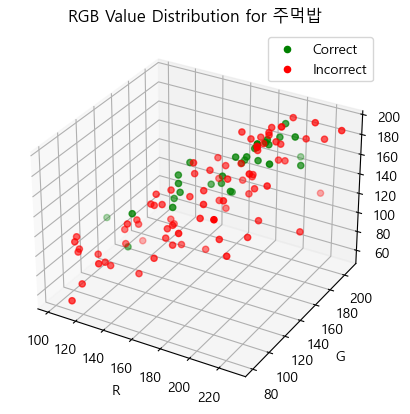

<Figure size 640x480 with 0 Axes>

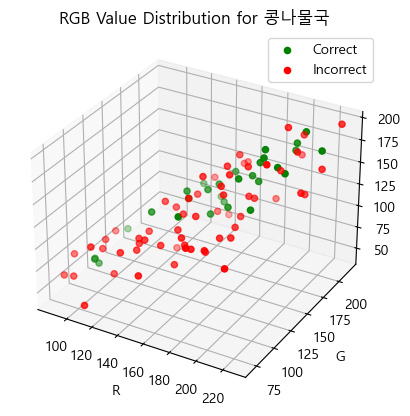

<Figure size 640x480 with 0 Axes>

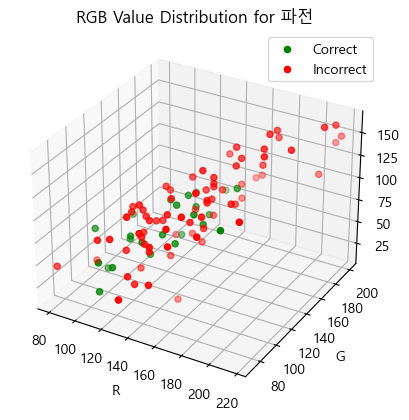

<Figure size 640x480 with 0 Axes>

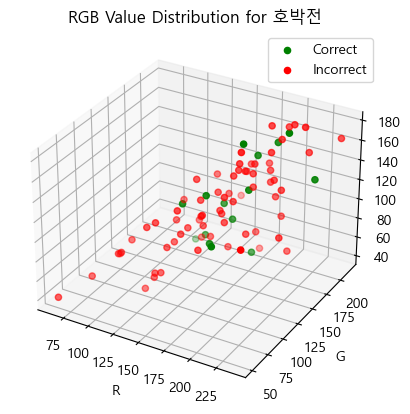

<Figure size 640x480 with 0 Axes>

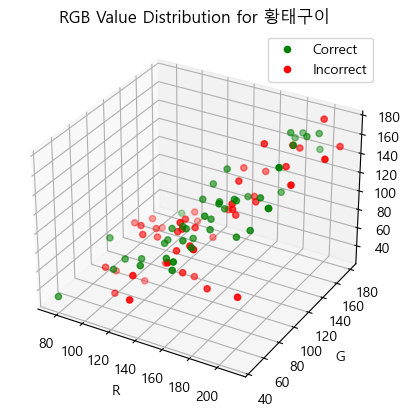

<Figure size 640x480 with 0 Axes>

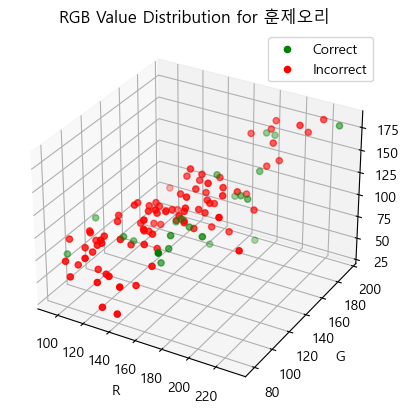

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

plt.rcParams['font.family'] = 'Malgun Gothic'

output_folder = 'Mission1_RGB_3D'
os.makedirs(output_folder, exist_ok=True)

# 'food' 카테고리 리스트
food_categories = rgb_values['food'].unique()

# 각 음식 카테고리별로 3D 그래프를 생성
for food in food_categories:
    plt.figure()
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # 선택한 음식 카테고리에 해당하는 데이터를 추출
    food_data = rgb_values[rgb_values['food'] == food]

    # 'Correct/Incorrect' 열로 데이터를 분리
    correct_data = food_data[food_data['Correct/Incorrect'] == 'correct']
    incorrect_data = food_data[food_data['Correct/Incorrect'] == 'incorrect']

    # 'correct' 데이터를 3D 산점도로 표시
    ax.scatter(correct_data['R'], correct_data['G'], correct_data['B'], c='green', label='Correct')

    # 'incorrect' 데이터를 3D 산점도로 표시
    ax.scatter(incorrect_data['R'], incorrect_data['G'], incorrect_data['B'], c='red', label='Incorrect')

    ax.set_xlabel('R')
    ax.set_ylabel('G')
    ax.set_zlabel('B')
    ax.set_title(f'RGB Value Distribution for {food}')

    # 범례 추가
    ax.legend()

    output_file = os.path.join(output_folder, f'{food}_RGB_3D.png')
    plt.savefig(output_file)
    
    plt.show()

<Figure size 640x480 with 0 Axes>

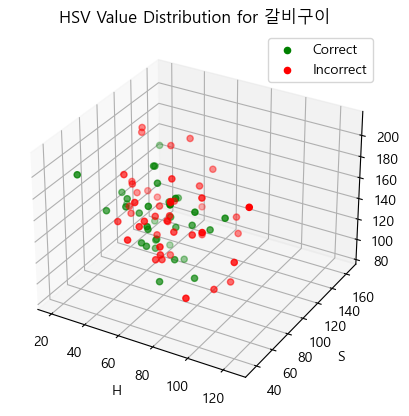

<Figure size 640x480 with 0 Axes>

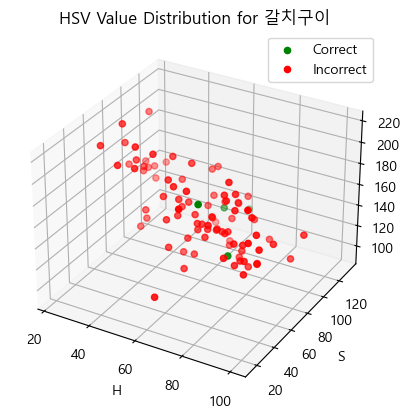

<Figure size 640x480 with 0 Axes>

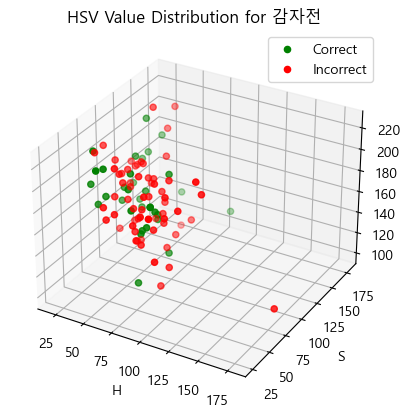

<Figure size 640x480 with 0 Axes>

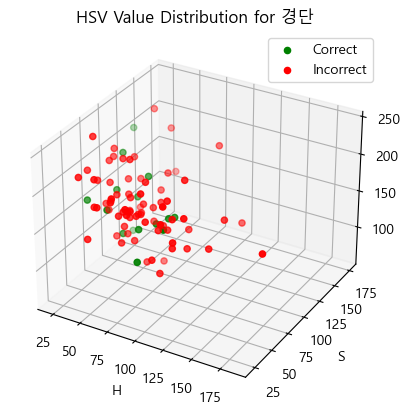

<Figure size 640x480 with 0 Axes>

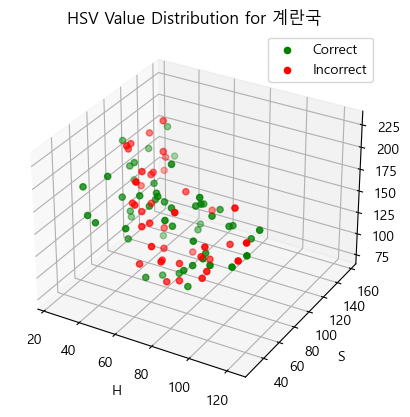

<Figure size 640x480 with 0 Axes>

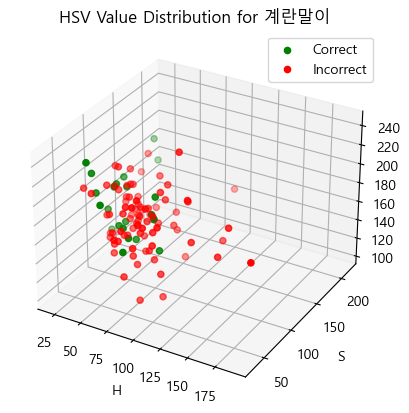

<Figure size 640x480 with 0 Axes>

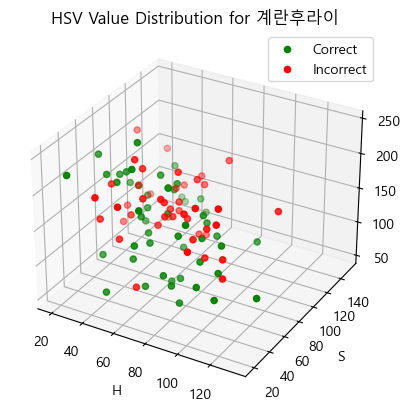

<Figure size 640x480 with 0 Axes>

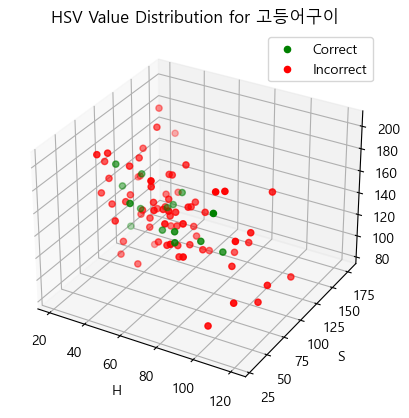

<Figure size 640x480 with 0 Axes>

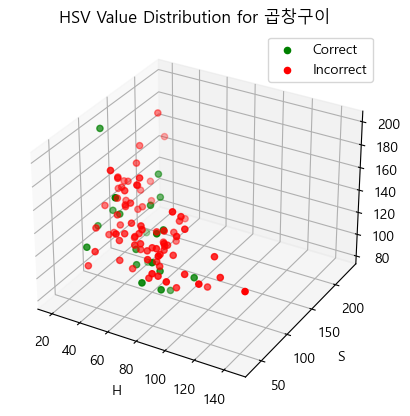

<Figure size 640x480 with 0 Axes>

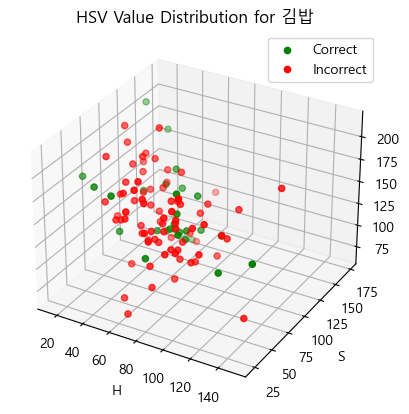

<Figure size 640x480 with 0 Axes>

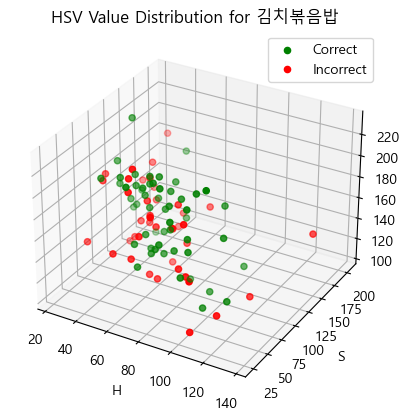

<Figure size 640x480 with 0 Axes>

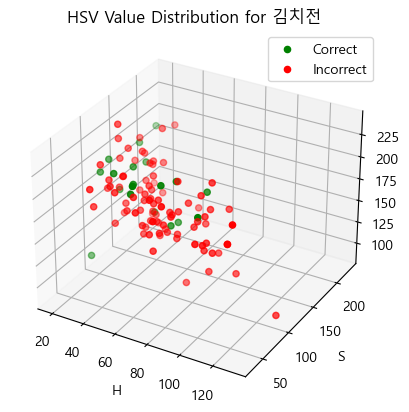

<Figure size 640x480 with 0 Axes>

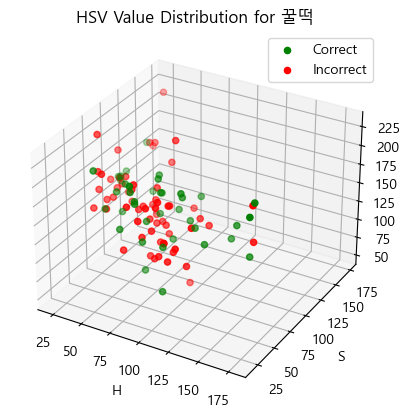

<Figure size 640x480 with 0 Axes>

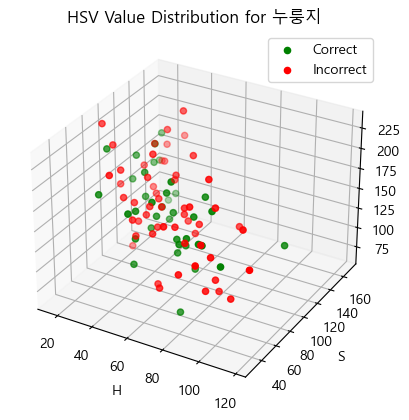

<Figure size 640x480 with 0 Axes>

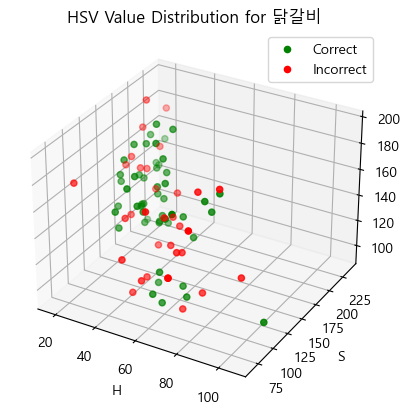

<Figure size 640x480 with 0 Axes>

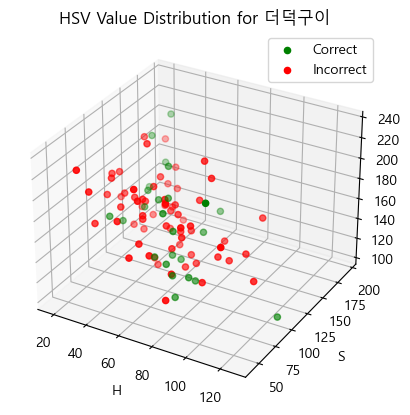

<Figure size 640x480 with 0 Axes>

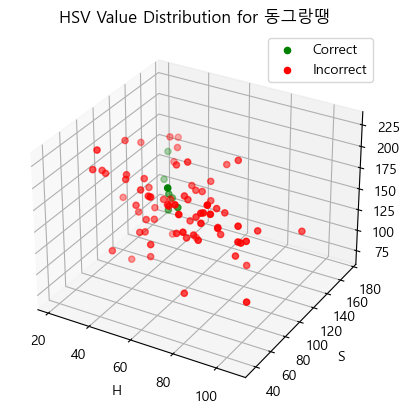

<Figure size 640x480 with 0 Axes>

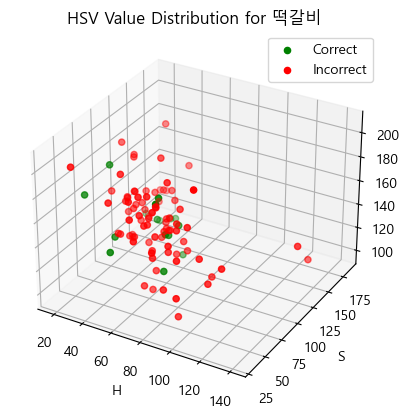

<Figure size 640x480 with 0 Axes>

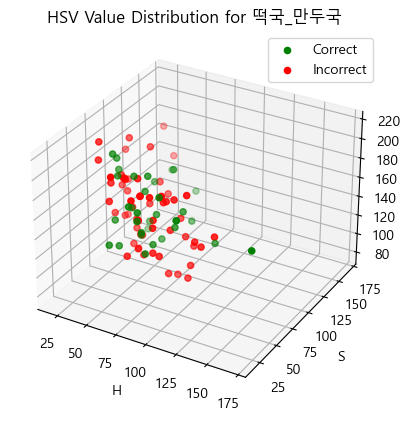

<Figure size 640x480 with 0 Axes>

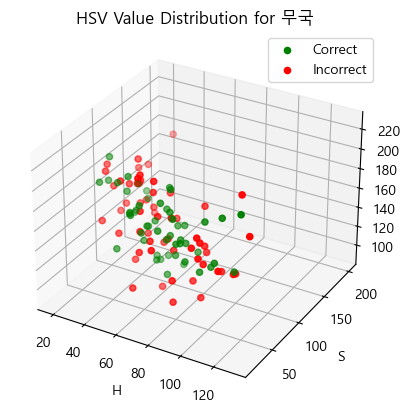

<Figure size 640x480 with 0 Axes>

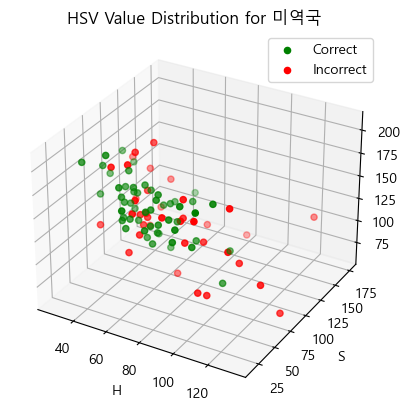

<Figure size 640x480 with 0 Axes>

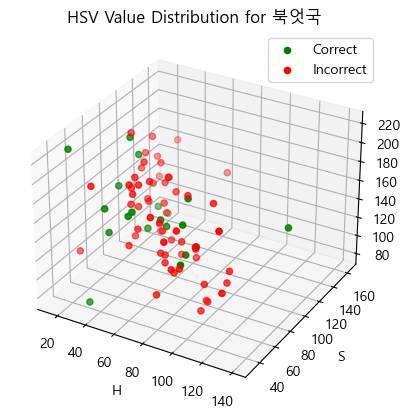

<Figure size 640x480 with 0 Axes>

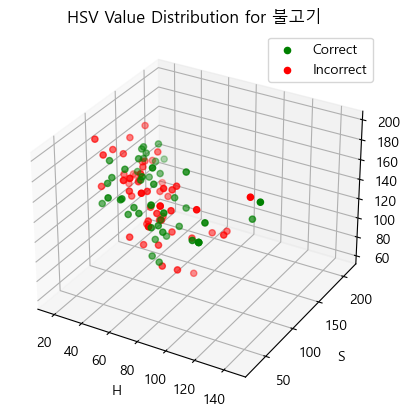

<Figure size 640x480 with 0 Axes>

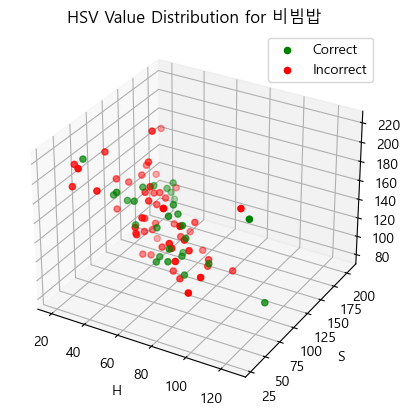

<Figure size 640x480 with 0 Axes>

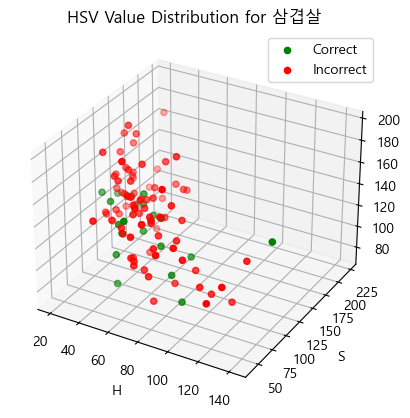

<Figure size 640x480 with 0 Axes>

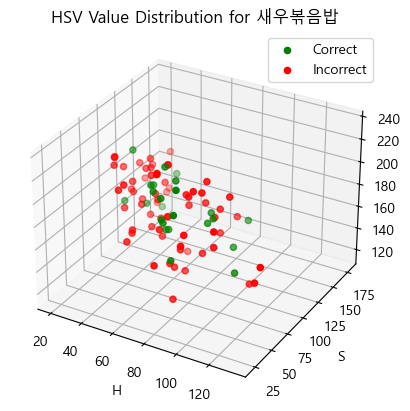

<Figure size 640x480 with 0 Axes>

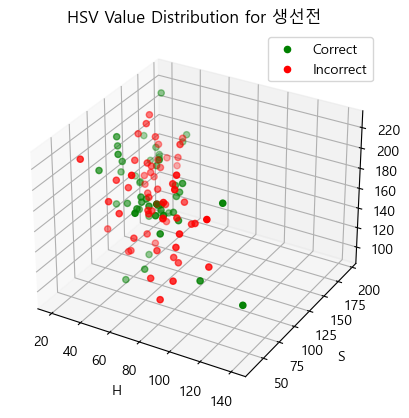

<Figure size 640x480 with 0 Axes>

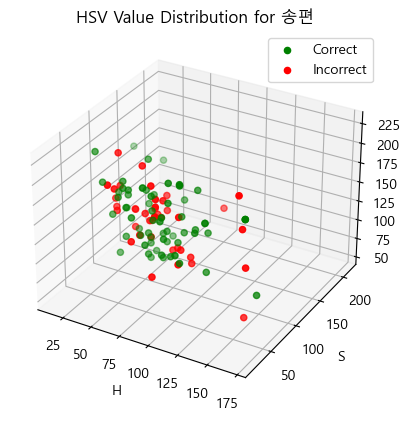

<Figure size 640x480 with 0 Axes>

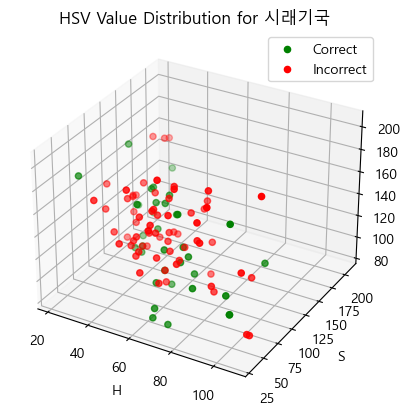

<Figure size 640x480 with 0 Axes>

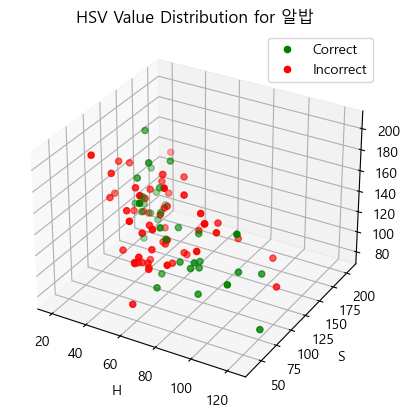

<Figure size 640x480 with 0 Axes>

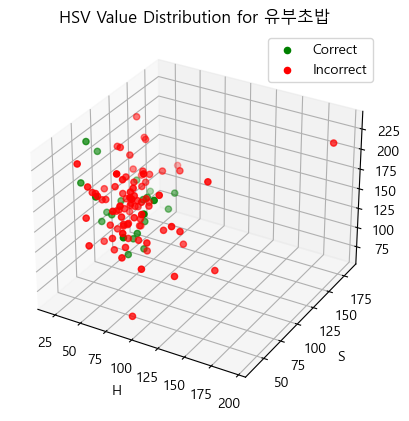

<Figure size 640x480 with 0 Axes>

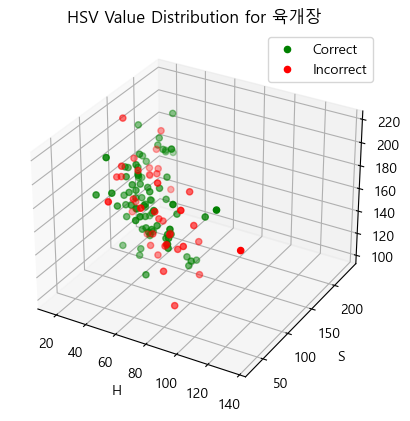

<Figure size 640x480 with 0 Axes>

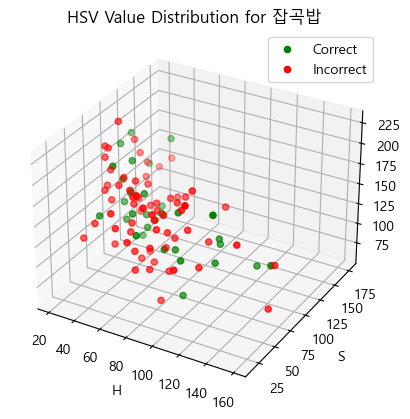

<Figure size 640x480 with 0 Axes>

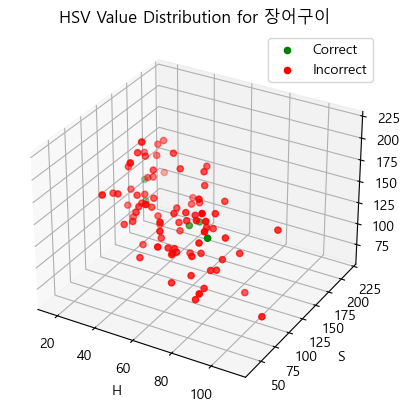

<Figure size 640x480 with 0 Axes>

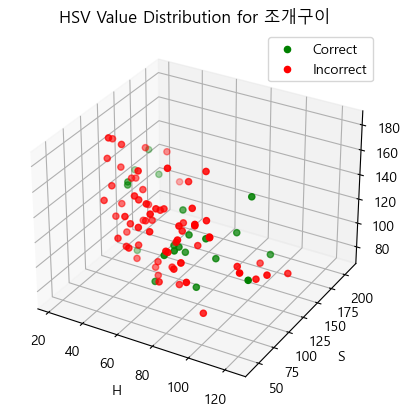

<Figure size 640x480 with 0 Axes>

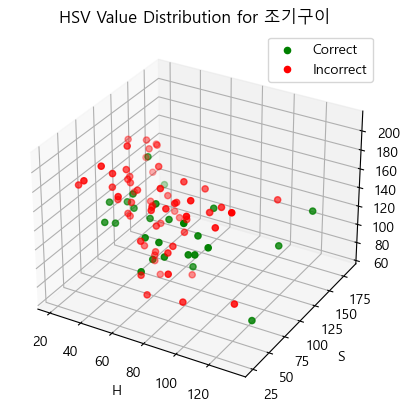

<Figure size 640x480 with 0 Axes>

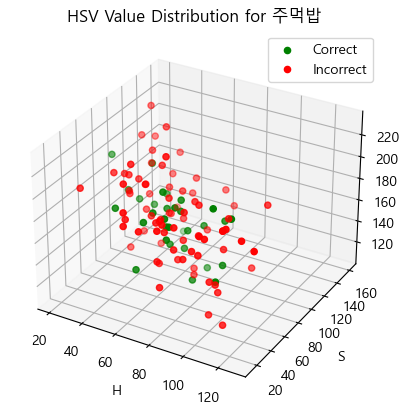

<Figure size 640x480 with 0 Axes>

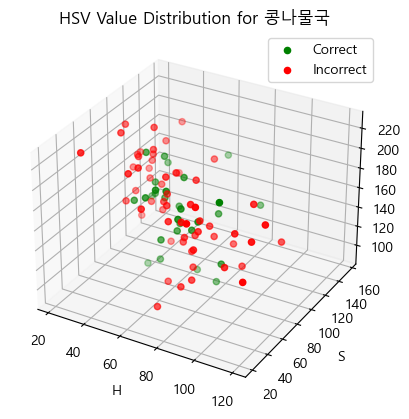

<Figure size 640x480 with 0 Axes>

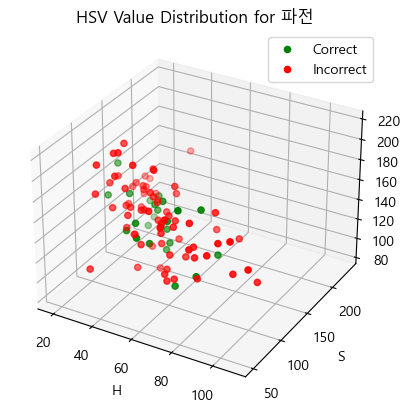

<Figure size 640x480 with 0 Axes>

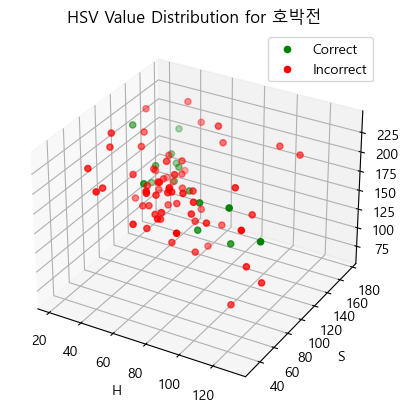

<Figure size 640x480 with 0 Axes>

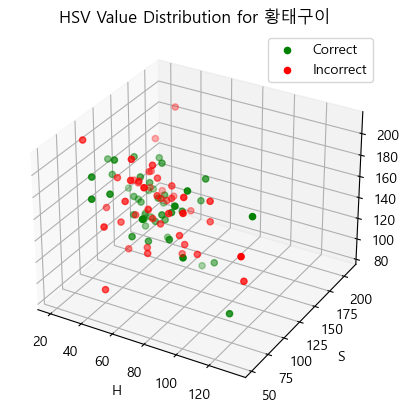

<Figure size 640x480 with 0 Axes>

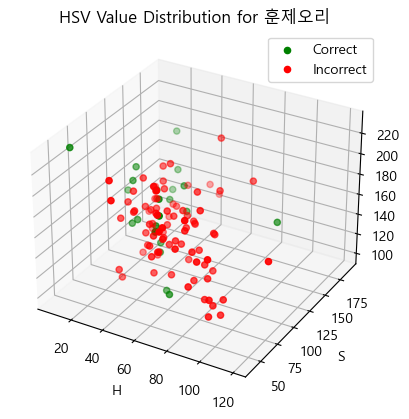

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

output_folder = 'Mission1_HSV_3D'
os.makedirs(output_folder, exist_ok=True)

# 'food' 카테고리 리스트
food_categories = hsv_values['food'].unique()

# 각 음식 카테고리별로 3D 그래프를 생성
for food in food_categories:
    plt.figure()
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # 선택한 음식 카테고리에 해당하는 데이터를 추출
    food_data = hsv_values[hsv_values['food'] == food]

    # 'Correct/Incorrect' 열로 데이터를 분리
    correct_data = food_data[food_data['Correct/Incorrect'] == 'correct']
    incorrect_data = food_data[food_data['Correct/Incorrect'] == 'incorrect']

    # 'correct' 데이터를 3D 산점도로 표시
    ax.scatter(correct_data['H'], correct_data['S'], correct_data['V'], c='green', label='Correct')

    # 'incorrect' 데이터를 3D 산점도로 표시
    ax.scatter(incorrect_data['H'], incorrect_data['S'], incorrect_data['V'], c='red', label='Incorrect')

    ax.set_xlabel('H')
    ax.set_ylabel('S')
    ax.set_zlabel('B')
    ax.set_title(f'HSV Value Distribution for {food}')

    # 범례 추가
    ax.legend()

    output_file = os.path.join(output_folder, f'{food}_HSV_3D.png')
    plt.savefig(output_file)
    
    plt.show()

#### Grad-CAM

In [ ]:
# 체크포인트 파일 경로
checkpoint_filepath = './Checkpoint/Mission1.h5'

# 모델 로드
loaded_model = load_model(checkpoint_filepath)

In [ ]:
conv_layers = []

for layer in loaded_model.get_layer('model').layers:
    if 'conv' in layer.name:
        conv_layers.append(layer.name)

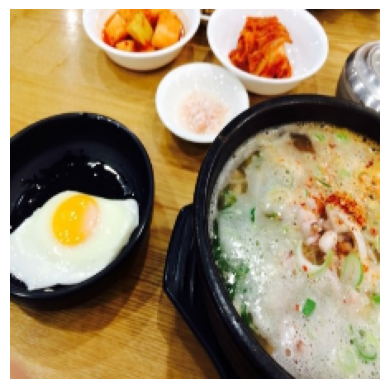

In [ ]:
import cv2
import matplotlib.pyplot as plt

# 이미지 경로
image_path = './mission1_val/Img_099_0710.jpg'

# 이미지를 224x224 크기로 리사이징
desired_size = (224, 224)
original_image = cv2.imread(image_path)
resized_image = cv2.resize(original_image, desired_size)

# 시각화
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.axis('off')  # 축 숨기기
plt.show()

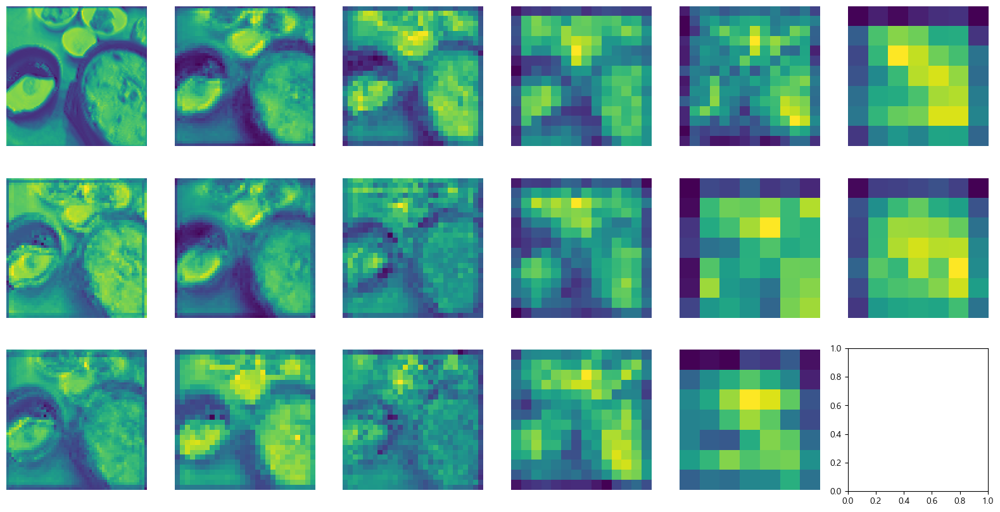

In [ ]:
# Grad-CAM 이미지를 저장할 리스트
cam_images = []

for layer in conv_layers:
    # 모델 내의 "model" 레이어를 가져옵니다.
    model_layer = loaded_model.get_layer('model')

    # "model" 레이어 내에서 첫 번째 합성곱 레이어를 선택합니다.
    conv_layer = model_layer.get_layer(layer)  # 예시로 'conv2d' 레이어를 선택

    # Grad-CAM 모델을 생성합니다.
    grad_model = Model(inputs=model_layer.input, outputs=[conv_layer.output, model_layer.output])

    # 이미지를 로드하고 크기를 조정합니다.
    image = load_img(image_path, target_size=(224, 224))

    # 이미지를 텐서로 변환합니다.
    image = img_to_array(image)
    image = tf.expand_dims(image, axis=0)  # 배치 차원을 추가하여 (1, 224, 224, 3) 형태로 변환

    # 이미지를 모델에 전달하여 활성화 맵과 예측을 얻습니다.
    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(image)

        
    # 원하는 클래스(예측 결과)의 그래디언트를 계산합니다.
    predicted_class = np.argmax(predictions)
    grads = tape.gradient(predictions, conv_output)
    grads = grads[0]  # 배치 차원을 제거합니다

    # Global Average Pooling을 적용하여 클래스에 대한 가중 평균을 얻습니다.
    weights = tf.reduce_mean(grads, axis=(0, 1))

    # 활성화 맵과 가중 평균을 곱하여 Grad-CAM을 얻습니다.
    cam = np.ones(conv_output.shape[0:2], dtype=np.float32)
    for i, w in enumerate(weights):
        cam += w * conv_output[:, :, :, i]

    # Grad-CAM 이미지를 리스트에 추가
    cam_images.append(cam[0])

# Grad-CAM 이미지를 3개의 행에 나란히 표시
num_rows = 3  # 행의 개수
num_cols = (len(cam_images) + num_rows - 1) // num_rows  # 열의 개수 계산

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))  # 여러 이미지를 나란히 출력하기 위한 그림 생성

for i, cam in enumerate(cam_images):
    row = i % num_rows  # 행 인덱스 계산
    col = i // num_rows  # 열 인덱스 계산
    axes[row, col].imshow(cam, cmap='viridis')  # 각각의 축에 Grad-CAM 이미지 출력
    # axes[row, col].set_title(f'Layer: {conv_layers[i]}')  # 각 축에 레이어 이름 표시
    axes[row, col].axis('off')  # 축 제거

plt.show()

## 2-2,3 : 2-1의 분석을 기반으로 성능 향상을 위한 작업을 수행, 경향 파악

- 총 8번의 학습 및 비교 분석 진행
- 해당 ipynb파일에선 가장 좋은 방식인 2-4차의 학습 진행 코드를 포함

#### 모델 학습 진행

In [ ]:
# 데이터 폴더 경로 설정
train_data_dir = './Kfood/kfood_train/train/'  # 학습용 데이터 폴더 경로
val_data_dir = './Kfood/kfood_val/val/' # 검증용 데이터 폴더 경로

all_items = os.listdir(train_data_dir)
num_classes = len(all_items)

In [ ]:
def mosaic_augmentation(image):
    # 이미지를 4등분하여 각 부분에 모자이크를 적용
    height, width, _ = image.shape
    quarter_height, quarter_width = height // 2, width // 2

    # 랜덤한 위치에서 시작점을 선택
    start_x = np.random.randint(0, quarter_height)
    start_y = np.random.randint(0, quarter_width)

    # 모자이크할 영역 선택
    end_x = start_x + quarter_height
    end_y = start_y + quarter_width

    # 모자이크 적용
    image[start_x:end_x, start_y:end_y, :] = np.mean(image[start_x:end_x, start_y:end_y, :], axis=(0, 1), keepdims=True)

    return image

In [ ]:
# 이미지 크기 설정
img_width, img_height = 224, 224

# 데이터 증강 설정
train_datagen = ImageDataGenerator(
    rescale=1. / 255,  # 이미지 값을 0과 1 사이로 정규화
    
    rotation_range=20,  # 회전
    
    width_shift_range=0.2,  # 가로 이동
    height_shift_range=0.2,  # 세로 이동
    
    shear_range=0.2,  # 전단 변형
    
    horizontal_flip=True,  # 수평 뒤집기
    vertical_flip=True,  # 수직 뒤집기
    
    channel_shift_range=40,  # 채널 시프트
    preprocessing_function=mosaic_augmentation,
    zoom_range=0.2,  # 확대/축소
)

val_datagen = ImageDataGenerator(
    rescale=1. / 255, # 이미지 값을 0과 1 사이로 정규화
)

In [ ]:
# 학습용 데이터 로딩 및 전처리
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=32,
    class_mode='categorical', # 다중 클래스 분류를 위해 categorical로 설정  
)

validation_generator = val_datagen.flow_from_directory(
    val_data_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical')

Found 33593 images belonging to 42 classes.
Found 4198 images belonging to 42 classes.


In [ ]:
# Classifiers에서 제공되는 모델 목록 확인
model_list = Classifiers.models_names()

In [ ]:
ResNet101, preprocess_input = Classifiers.get('resnet101')
resnet101_model = ResNet101((img_height, img_width, 3), 
                 activation = 'softmax',
                 pretrained = False,
                 include_top = False,
                 pretrained_top = False,
                 classes = num_classes)

In [ ]:
model = models.Sequential()
model.add(resnet101_model)
model.add(layers.Flatten())
model.add(layers.Dense(42, activation='softmax'))

In [ ]:
learning_rate = 1e-4

optimizer = tfa.optimizers.RectifiedAdam(learning_rate = learning_rate)

model.compile(optimizer = optimizer, 
              loss = tf.keras.losses.CategoricalCrossentropy(label_smoothing = 0.2), 
              metrics = [tf.keras.metrics.TopKCategoricalAccuracy(k=1)])

In [ ]:
# 체크포인트 파일 경로 및 설정
checkpoint_filepath = './Checkpoint/Mission2_mosaic_resnet.h5'
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_best_only=True,  # 최상의 모델만 저장
    monitor='val_top_k_categorical_accuracy',
    mode='max',
    verbose=1
)

reduce_lr_callback = ReduceLROnPlateau(
    monitor='val_loss',  # 검증 손실을 모니터링
    factor=0.2,  # 학습률을 0.2배로 줄임
    patience=5,  # 5 에폭 동안 검증 손실이 감소하지 않으면 학습률을 조절
    min_lr=1e-6  # 학습률의 하한 설정
)

# 모델을 학습할 때 ModelCheckpoint 콜백을 지정
with tf.device('/device:GPU:0'): 
    history = model.fit(
        train_generator,
        epochs=50,
        verbose=1,
        validation_data=validation_generator,
        callbacks=[model_checkpoint_callback, reduce_lr_callback]
    )

#### 검증 데이터에 대한 평가 진행

In [4]:
# 체크포인트 파일 경로
checkpoint_filepath = './Checkpoint/Mission2.h5'

# 미션 1 모델 로드
loaded_model = load_model(checkpoint_filepath)

# 데이터 제너레이터 설정
train_data_dir = './Kfood/Kfood/kfood_train/train/' 

train_datagen = ImageDataGenerator(
    rescale=1.0 / 255
    ) 

# 이미지 크기 설정
img_width, img_height = 224, 224

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=1,
    class_mode='categorical',
    shuffle=False
)

Found 33593 images belonging to 42 classes.


In [5]:
with tf.device('/device:GPU:0'): 
    train_predict = loaded_model.predict(train_generator)

train_pred_classes = np.argmax(train_predict,axis=1)

# classification report 출력
target_names = list(train_generator.class_indices.keys())

results = pd.DataFrame(classification_report(train_generator.classes, train_pred_classes, target_names=target_names, output_dict=True)).transpose()
print(results)

 7617/33593 [=====>........................] - ETA: 12:41

c:\Users\coden\anaconda3\envs\tf_gpu\lib\site-packages\PIL\Image.py:970: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


 7731/33593 [=====>........................] - ETA: 12:37

In [ ]:
# 체크포인트 파일 경로
checkpoint_filepath = './Checkpoint/Mission2.h5'

# 모델 로드
loaded_model = load_model(checkpoint_filepath)

# 검증용 데이터 제너레이터 설정
val_data_dir = './Kfood/Kfood/kfood_val/val/'

validation_datagen = ImageDataGenerator(rescale=1.0 / 255) 

# 이미지 크기 설정
img_width, img_height = 224, 224

validation_generator = validation_datagen.flow_from_directory(
    val_data_dir,
    target_size=(img_height, img_width),
    batch_size=1,
    class_mode='categorical',
    shuffle=False
)

In [ ]:
import numpy as np
with tf.device('/device:GPU:0'): 
    validation_predict = loaded_model.predict(validation_generator)


from sklearn.metrics import classification_report

validation_pred_classes = np.argmax(validation_predict,axis=1)

# classification report 출력
target_names = list(validation_generator.class_indices.keys())


validation_results = pd.DataFrame(classification_report(validation_generator.classes, validation_pred_classes, target_names=target_names, output_dict=True)).transpose()
print(validation_results)

In [ ]:
def plot_f1_score_by_class(ax, results, title, label, line_value=None):
    ax.bar(results.index, results['f1-score'], color=colors)
    ax.set_xlabel('Class')
    ax.set_ylabel('f1-score')
    ax.set_title(title)
    ax.set_xticklabels(results.index, rotation=90)
    ax.set_ylim(0, 1)
    
    if line_value is not None:
        ax.axhline(y=line_value, color='red', linestyle='--', label=label)

In [ ]:
plt.rcParams['font.family'] = 'Malgun Gothic'

plt.figure(figsize=(20, 8))

# Train 
ax1 = plt.subplot(1, 2, 1)
colors = ['palegreen' if score >= results.iloc[-3, 2] else 'royalblue' if score >= 0.5 else 'tomato' for score in results['f1-score']]
plot_f1_score_by_class(ax1, results.iloc[:-3,:], 'Train f1-score by Class', f'Train Accuracy = {results.iloc[-3, 2]:.2f}', results.iloc[-3, 2])
ax1.axhline(y=0.5, color='darkorchid', linestyle='--', label='0.5')
ax1.legend()

# Valid
ax2 = plt.subplot(1, 2, 2)
colors = ['palegreen' if score >= validation_results.iloc[-3, 2] else 'royalblue' if score >= 0.5 else 'tomato' for score in validation_results['f1-score']]
plot_f1_score_by_class(ax2, validation_results.iloc[:-3,:], 'Validation f1-score by Class', f'Validation Accuracy = {validation_results.iloc[-3, 2]:.2f}', validation_results.iloc[-3, 2])
ax2.axhline(y=0.5, color='darkorchid', linestyle='--', label='0.5')
ax2.legend()

plt.tight_layout()
plt.show()